In [1]:
%matplotlib inline
%reload_ext autoreload

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import seaborn as sns
import logging

FORMAT = "%(asctime)s %(message)s"

logging.basicConfig(level="INFO", format=FORMAT, datefmt="%d-%b-%y %H:%M:%S")
sns.set_context("talk")

In [3]:
epoch_key = 'Jaq', 3, 12

In [4]:
from src.load_data import load_data


data = load_data(epoch_key,
                 position_to_linearize=['nose_x', 'nose_y'],
                 max_distance_from_well=30,
                 min_distance_traveled=50,
                 )

17-Feb-22 13:23:46 Loading position info...
17-Feb-22 13:24:41 Loading multiunit...
17-Feb-22 13:25:04 Loading spikes...
17-Feb-22 13:25:11 Finding ripple times...


In [5]:
import numpy as np

detector_parameters = {
    'movement_var': 6.0,
    'replay_speed': 1,
    'place_bin_size': 2.5,
    'spike_model_knot_spacing': 12.5,
    'spike_model_penalty': 1E-5,
    'movement_state_transition_type': 'random_walk',
    'multiunit_model_kwargs': {
        'mark_std': 20.0, 'position_std': 8.0, 'block_size': 100},
    'discrete_state_transition_type': 'constant',
    'discrete_diagonal': np.array([0.00003, 0.968])
}

In [6]:
from replay_identification import ReplayDetector
from src.parameters import WTRACK_EDGE_ORDER, WTRACK_EDGE_SPACING


def predict_multiunit(is_training):
    replay_detector = ReplayDetector(**detector_parameters)
    logging.info(replay_detector)

    replay_detector.fit(
        is_ripple=data['is_ripple'],
        is_training=is_training,
        speed=data['position_info'].nose_vel,
        position=data['position_info'].linear_position,
        multiunit=data['multiunits'],
        track_graph=data['track_graph'],
        edge_order=WTRACK_EDGE_ORDER,
        edge_spacing=WTRACK_EDGE_SPACING,
        use_gpu=True,
    )

    results = replay_detector.predict(
        speed=data['position_info'].nose_vel,
        multiunit=data['multiunits'],
        position=data['position_info'].linear_position,
        time=data['position_info'].index / np.timedelta64(1, 's'),
        use_likelihoods=['multiunit'],
        use_acausal=True,
        set_no_spike_to_equally_likely=True,
        use_gpu=False
    )
    logging.info('Done!')
    
    return detector, results    

In [10]:
data_log_likelihood_clusterless = []
results_clusterless = []
detector_clusterless = []

for i in range(10):
    print(i)
    if i == 0:
        is_training = ~data['is_ripple'].values.squeeze()
    else:
        is_training = 1 - results.non_local_probability
        
    detector, results = predict_multiunit(is_training)
    data_log_likelihood_clusterless.append(results.data_log_likelihood)
    
    results_clusterless.append(results)
    detector_clusterless.append(detector)
    

09-Feb-22 19:45:04 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
               replay_state_transition_penalty=1e-05, speed_knots=None,
               speed_threshold=4.0, spike_mode

0


09-Feb-22 19:45:06 Fitting multiunit model...
09-Feb-22 19:45:07 Fitting replay movement state transition...
09-Feb-22 19:45:07 Fitting replay state transition...
09-Feb-22 19:45:07 Predicting multiunit likelihood...


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

09-Feb-22 19:52:12 Finding causal non-local probability and position...
09-Feb-22 19:52:22 Finding acausal non-local probability and position...
09-Feb-22 19:53:00 Done!
09-Feb-22 19:53:00 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

1


09-Feb-22 19:53:00 Fitting speed model...
09-Feb-22 19:53:01 Fitting multiunit model...
09-Feb-22 19:53:02 Fitting replay movement state transition...
09-Feb-22 19:53:03 Fitting replay state transition...
09-Feb-22 19:53:03 Predicting multiunit likelihood...


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

09-Feb-22 20:00:25 Finding causal non-local probability and position...
09-Feb-22 20:00:35 Finding acausal non-local probability and position...
09-Feb-22 20:01:10 Done!
09-Feb-22 20:01:10 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

2


09-Feb-22 20:01:12 Fitting multiunit model...
09-Feb-22 20:01:13 Fitting replay movement state transition...
09-Feb-22 20:01:13 Fitting replay state transition...
09-Feb-22 20:01:13 Predicting multiunit likelihood...


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

09-Feb-22 20:08:32 Finding causal non-local probability and position...
09-Feb-22 20:08:42 Finding acausal non-local probability and position...
09-Feb-22 20:09:17 Done!
09-Feb-22 20:09:17 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

3


09-Feb-22 20:09:18 Fitting multiunit model...
09-Feb-22 20:09:20 Fitting replay movement state transition...
09-Feb-22 20:09:20 Fitting replay state transition...
09-Feb-22 20:09:20 Predicting multiunit likelihood...


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

09-Feb-22 20:16:40 Finding causal non-local probability and position...
09-Feb-22 20:16:50 Finding acausal non-local probability and position...
09-Feb-22 20:17:25 Done!
09-Feb-22 20:17:25 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

4


09-Feb-22 20:17:27 Fitting multiunit model...
09-Feb-22 20:17:28 Fitting replay movement state transition...
09-Feb-22 20:17:28 Fitting replay state transition...
09-Feb-22 20:17:28 Predicting multiunit likelihood...


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

09-Feb-22 20:24:47 Finding causal non-local probability and position...
09-Feb-22 20:24:58 Finding acausal non-local probability and position...
09-Feb-22 20:25:37 Done!
09-Feb-22 20:25:37 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

5


09-Feb-22 20:25:38 Fitting multiunit model...
09-Feb-22 20:25:39 Fitting replay movement state transition...
09-Feb-22 20:25:39 Fitting replay state transition...
09-Feb-22 20:25:39 Predicting multiunit likelihood...


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

09-Feb-22 20:33:00 Finding causal non-local probability and position...
09-Feb-22 20:33:10 Finding acausal non-local probability and position...
09-Feb-22 20:33:48 Done!
09-Feb-22 20:33:48 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

6


09-Feb-22 20:33:49 Fitting speed model...
09-Feb-22 20:33:50 Fitting multiunit model...
09-Feb-22 20:33:51 Fitting replay movement state transition...
09-Feb-22 20:33:51 Fitting replay state transition...
09-Feb-22 20:33:51 Predicting multiunit likelihood...


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

09-Feb-22 20:41:11 Finding causal non-local probability and position...
09-Feb-22 20:41:22 Finding acausal non-local probability and position...
09-Feb-22 20:41:58 Done!
09-Feb-22 20:41:58 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

7


09-Feb-22 20:41:59 Fitting multiunit model...
09-Feb-22 20:42:00 Fitting replay movement state transition...
09-Feb-22 20:42:01 Fitting replay state transition...
09-Feb-22 20:42:01 Predicting multiunit likelihood...


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

09-Feb-22 20:49:21 Finding causal non-local probability and position...
09-Feb-22 20:49:32 Finding acausal non-local probability and position...
09-Feb-22 20:50:10 Done!
09-Feb-22 20:50:10 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

8


09-Feb-22 20:50:11 Fitting multiunit model...
09-Feb-22 20:50:12 Fitting replay movement state transition...
09-Feb-22 20:50:12 Fitting replay state transition...
09-Feb-22 20:50:12 Predicting multiunit likelihood...


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

09-Feb-22 20:57:35 Finding causal non-local probability and position...
09-Feb-22 20:57:46 Finding acausal non-local probability and position...
09-Feb-22 20:58:22 Done!
09-Feb-22 20:58:22 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

9


09-Feb-22 20:58:23 Fitting multiunit model...
09-Feb-22 20:58:25 Fitting replay movement state transition...
09-Feb-22 20:58:25 Fitting replay state transition...
09-Feb-22 20:58:25 Predicting multiunit likelihood...


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

09-Feb-22 21:05:48 Finding causal non-local probability and position...
09-Feb-22 21:05:58 Finding acausal non-local probability and position...
09-Feb-22 21:06:33 Done!


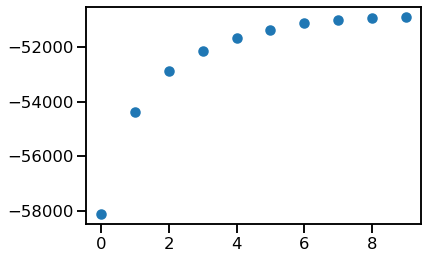

In [11]:
plt.scatter(np.arange(10), np.asarray(data_log_likelihood))

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import copy

from scipy.stats import zscore


def plot_detector(time_ind, data, replay_detector, detector_results,
                  figsize=(11, 6.0)):
    fig, axes = plt.subplots(6, 1,
                             figsize=figsize,
                             sharex=True,
                             constrained_layout=True,
                             gridspec_kw={
                                 'height_ratios': [1, 1, 3, 1, 3, 1]},
                            dpi=100)
    time = data['spikes'].iloc[time_ind].index / np.timedelta64(1, 's')
    
    # axes 0
    # max_consensus = np.ceil(zscore(data['ripple_consensus_trace'], nan_policy='omit').values.max()).astype(int)
    start_time = data['spikes'].iloc[time_ind].index.min()
    end_time = data['spikes'].iloc[time_ind].index.max()
    ripple_consensus_trace = zscore(data['ripple_consensus_trace'], nan_policy='omit').loc[start_time:end_time]
    
    max_consensus = max(int(np.ceil(ripple_consensus_trace.max())), 5)
    min_consensus = min(int(np.ceil(ripple_consensus_trace.min())), -1)
    ripple_consensus_trace_time = ripple_consensus_trace.index / np.timedelta64(1, 's')
    
    axes[0].fill_between(
        time, np.ones_like(time) * max_consensus,
        where=data['ripple_labels'].iloc[time_ind].values.squeeze() > 0,
        color='red', zorder=-2, alpha=0.6, step='pre')
    axes[0].fill_between(
        ripple_consensus_trace_time,
        ripple_consensus_trace.values.squeeze(), color='black')
    axes[0].set_ylim((min_consensus, max_consensus))
    axes[0].set_yticks((min_consensus, max_consensus))
    axes[0].set_ylabel("Ripple\nStd.")
    
    # axes 1
    multiunit_firing = (
        data["multiunit_firing_rate"]
        .reset_index(drop=True)
        .set_index(
            data["multiunit_firing_rate"].index / np.timedelta64(1, "s"))
    )
    max_multiunit = np.ceil(data["multiunit_firing_rate"].values.max()).astype(int)
    axes[1].fill_between(
        multiunit_firing.iloc[time_ind].index.values,
        multiunit_firing.iloc[time_ind].values.squeeze(),
        color="black",
    )
    axes[1].fill_between(
        time, np.ones_like(time) * max_multiunit,
        where=data["multiunit_high_synchrony_labels"].iloc[time_ind].values.squeeze() > 0,
        color='blue', zorder=-2, alpha=0.6, step='pre')
    axes[1].set_ylim((0, max_multiunit))
    axes[1].set_yticks((0, max_multiunit))
    axes[1].set_ylabel("Multiunit\nRate\n[spikes / s]")

    # axes 2
    try:
        place_fields = (
            replay_detector._spiking_likelihood
            .keywords['place_conditional_intensity']).squeeze()
        n_neurons = place_fields.shape[1]
        place_field_max = np.nanargmax(place_fields, axis=0)
        linear_position_order = place_field_max.argsort(axis=0).squeeze()
        spike_time_ind, neuron_ind = np.nonzero(
            np.asarray(data['spikes'].iloc[time_ind])[:, linear_position_order])
        axes[2].set_ylabel('Cells')
    except AttributeError:
        spike_time_ind, neuron_ind = np.nonzero(np.any(~np.isnan(
            data['multiunits'].isel(time=time_ind)), axis=1).values)
        n_neurons = data['multiunits'].shape[-1]
        axes[2].set_ylabel('Tetrodes')

    axes[2].scatter(time[spike_time_ind], neuron_ind,
                    clip_on=False, s=10, color='black', marker='|', rasterized=True)
    axes[2].set_ylim((0, n_neurons))
    axes[2].set_yticks((0, n_neurons))
    axes[2].fill_between(
        time, np.ones_like(time) * n_neurons,
        where=detector_results.isel(time=time_ind).non_local_probability >= 0.80,
        color='green', zorder=-1, alpha=0.6, step='pre')
    
    # axes 3
    detector_results.isel(time=time_ind).non_local_probability.plot(
        x='time', ax=axes[3], color='black', clip_on=False)
    axes[3].set_ylabel('Prob.')
    axes[3].set_xlabel("")
    axes[3].set_ylim((0, 1))

    cmap = copy.copy(plt.get_cmap('bone_r'))
    cmap.set_bad(color="lightgrey", alpha=1.0)

    # axes 4
    (detector_results
     .isel(time=time_ind)
     .acausal_posterior
     .sum('state')
     .where(replay_detector.is_track_interior_)
     .plot(x='time', y='position', ax=axes[4], cmap=cmap,
           vmin=0.0, vmax=0.05))
    axes[4].scatter(data['position_info'].iloc[time_ind].index /
                    np.timedelta64(1, 's'),
                    data['position_info'].iloc[time_ind].linear_position,
                    s=1,
                    color='magenta', clip_on=False)
    axes[4].set_xlabel("")
    max_position = np.ceil(data['position_info'].linear_position.max()).astype(int)
    axes[4].set_yticks((0.0, max_position))
    axes[4].set_ylim((0.0, max_position))
    axes[4].set_ylabel('Position [cm]')
    
    # axes 5
    speed = np.asarray(data['position_info'].iloc[time_ind].nose_vel).squeeze()
    max_speed = np.ceil(speed.max()).astype(int)
    max_speed = max(5, max_speed)
    axes[5].fill_between(time, speed, color='grey')
    axes[5].axhline(4, color='black', linestyle='--', linewidth=1)
    axes[5].set_ylabel('Speed\n[cm / s]')
    axes[5].set_yticks((0.0, max_speed))
    axes[5].set_ylim((0.0, max_speed))
    
    axes[-1].set_xlabel('Time [s]')
    axes[-1].xaxis.set_major_formatter(plt.FormatStrFormatter('%.1f'))
    sns.despine(offset=5)

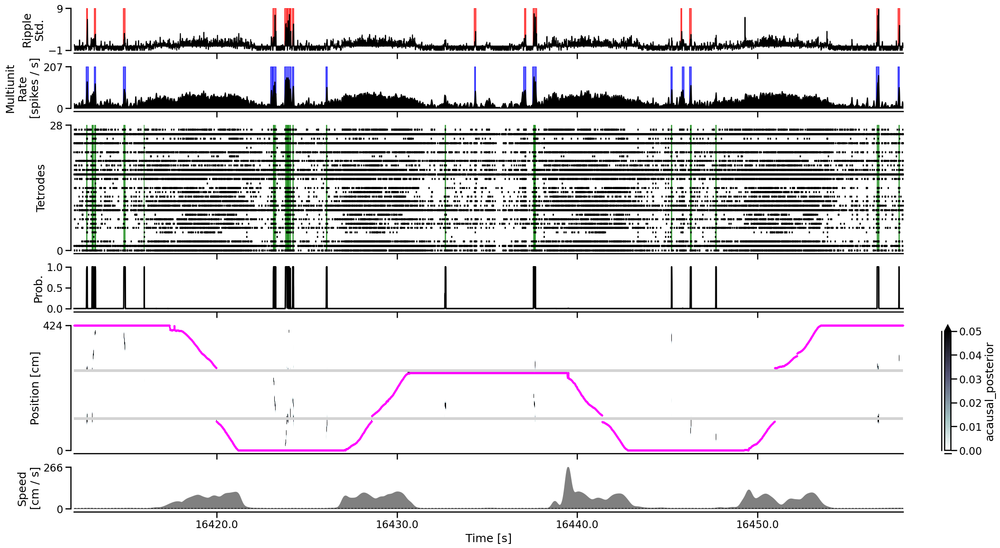

In [16]:
time_slice = slice(22_000, 45_000)
plot_detector(time_slice, data, replay_detector, results, figsize=(22, 12.0))

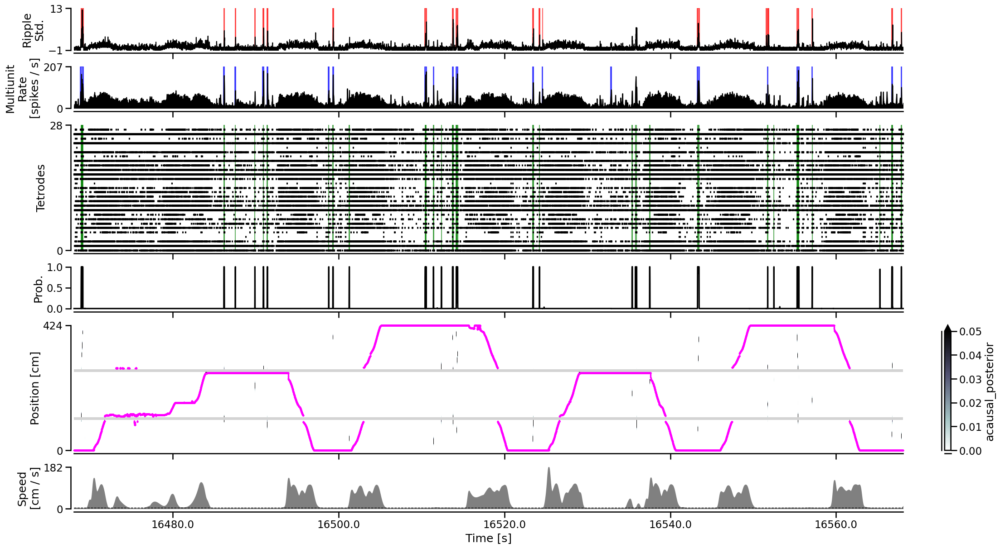

In [17]:
time_slice = slice(50_000, 100_000)
plot_detector(time_slice, data, replay_detector, results, figsize=(22, 12.0))

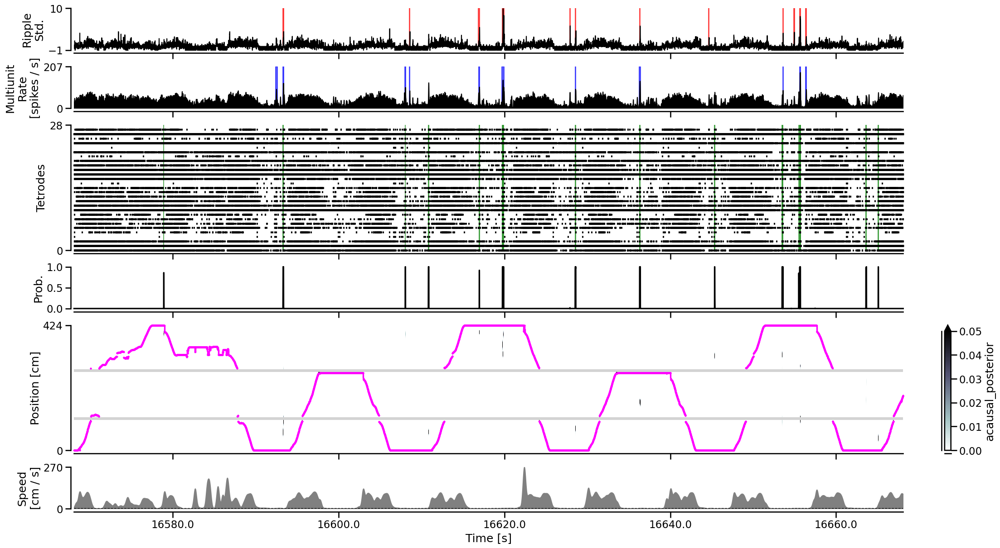

In [18]:
time_slice = slice(100_000, 150_000)
plot_detector(time_slice, data, replay_detector, results, figsize=(22, 12.0))

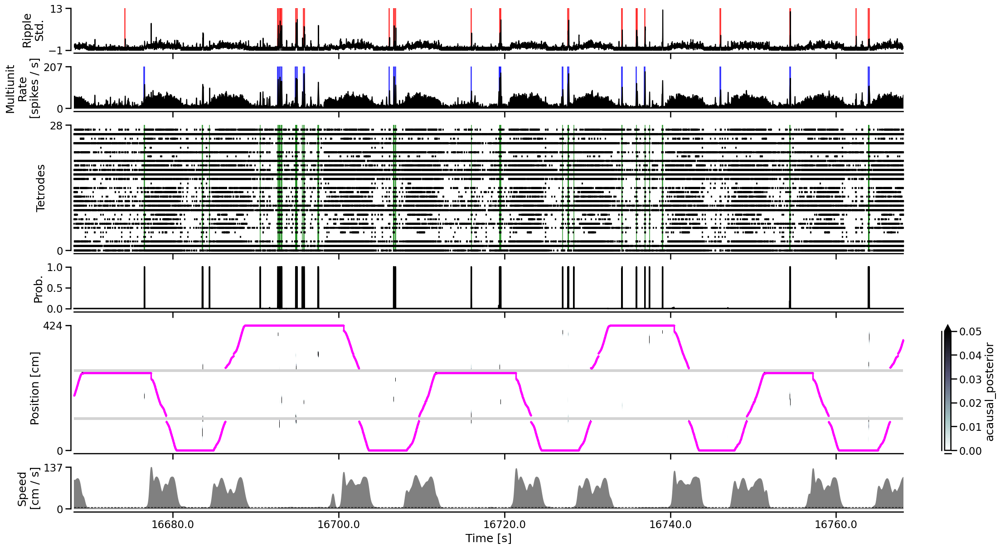

In [19]:
time_slice = slice(150_000, 200_000)
plot_detector(time_slice, data, replay_detector, results, figsize=(22, 12.0))

In [9]:
from replay_identification import ReplayDetector
from src.parameters import WTRACK_EDGE_ORDER, WTRACK_EDGE_SPACING


def predict_spikes(is_training, detector_parameters):
    replay_detector = ReplayDetector(**detector_parameters)
    logging.info(replay_detector)

    replay_detector.fit(
        is_ripple=data['is_ripple'],
        is_training=is_training,
        speed=data['position_info'].nose_vel,
        position=data['position_info'].linear_position,
        spikes=data['spikes'],
        track_graph=data['track_graph'],
        edge_order=WTRACK_EDGE_ORDER,
        edge_spacing=WTRACK_EDGE_SPACING,
        use_gpu=True,
    )

    results = replay_detector.predict(
        speed=data['position_info'].nose_vel,
        position=data['position_info'].linear_position,
        spikes=data['spikes'],
        time=data['position_info'].index / np.timedelta64(1, 's'),
        use_likelihoods=['spikes'],
        use_acausal=True,
        set_no_spike_to_equally_likely=True,
        use_gpu=False,
    )
    logging.info('Done!')
    
    return replay_detector, results    

In [ ]:
data_log_likelihood_sorted_spikes = []
detector_sorted_spikes = []
results_sorted_spikes = []

for i in range(10):
    print(i)
    if i == 0:
        is_training = ~data['is_ripple'].values.squeeze()
    else:
        is_training = ((1 - results.non_local_probability)).values
        
    detector, results = predict_spikes(is_training)
    data_log_likelihood_sorted_spikes.append(results.data_log_likelihood)
    detector_sorted_spikes.append(detector)
    results_sorted_spikes.append(results)

14-Feb-22 17:14:31 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
               replay_state_transition_penalty=1e-05, speed_knots=None,
               speed_threshold=4.0, spike_mode

0


14-Feb-22 17:14:31 Fitting speed model...
14-Feb-22 17:14:33 Fitting spiking model...
14-Feb-22 17:22:09 Fitting replay movement state transition...
14-Feb-22 17:22:10 Fitting replay state transition...
14-Feb-22 17:22:10 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

14-Feb-22 17:23:32 Finding causal non-local probability and position...
14-Feb-22 17:23:41 Finding acausal non-local probability and position...
14-Feb-22 17:24:18 Done!
14-Feb-22 17:24:18 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

1


14-Feb-22 17:24:19 Fitting speed model...
14-Feb-22 17:24:20 Fitting spiking model...
14-Feb-22 17:31:41 Fitting replay movement state transition...
14-Feb-22 17:31:41 Fitting replay state transition...
14-Feb-22 17:31:41 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

14-Feb-22 17:33:03 Finding causal non-local probability and position...
14-Feb-22 17:33:12 Finding acausal non-local probability and position...
14-Feb-22 17:33:42 Done!
14-Feb-22 17:33:42 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

2


14-Feb-22 17:33:44 Fitting spiking model...
14-Feb-22 17:41:07 Fitting replay movement state transition...
14-Feb-22 17:41:07 Fitting replay state transition...
14-Feb-22 17:41:07 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

14-Feb-22 17:42:28 Finding causal non-local probability and position...
14-Feb-22 17:42:37 Finding acausal non-local probability and position...
14-Feb-22 17:43:14 Done!
14-Feb-22 17:43:14 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

3


14-Feb-22 17:43:15 Fitting spiking model...
14-Feb-22 17:50:30 Fitting replay movement state transition...
14-Feb-22 17:50:31 Fitting replay state transition...
14-Feb-22 17:50:31 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

14-Feb-22 17:51:52 Finding causal non-local probability and position...
14-Feb-22 17:52:01 Finding acausal non-local probability and position...
14-Feb-22 17:52:35 Done!
14-Feb-22 17:52:35 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

4


14-Feb-22 17:52:36 Fitting speed model...
14-Feb-22 17:52:37 Fitting spiking model...
14-Feb-22 17:59:57 Fitting replay movement state transition...
14-Feb-22 17:59:58 Fitting replay state transition...
14-Feb-22 17:59:58 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

14-Feb-22 18:01:20 Finding causal non-local probability and position...
14-Feb-22 18:01:29 Finding acausal non-local probability and position...
14-Feb-22 18:02:02 Done!
14-Feb-22 18:02:02 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

5


14-Feb-22 18:02:02 Fitting speed model...
14-Feb-22 18:02:04 Fitting spiking model...
14-Feb-22 18:09:25 Fitting replay movement state transition...
14-Feb-22 18:09:25 Fitting replay state transition...
14-Feb-22 18:09:25 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

14-Feb-22 18:10:46 Finding causal non-local probability and position...
14-Feb-22 18:10:54 Finding acausal non-local probability and position...


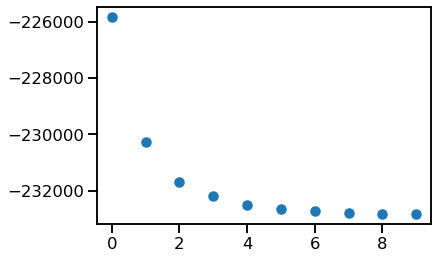

In [10]:
plt.scatter(np.arange(10), np.asarray(data_log_likelihood_sorted_spikes))

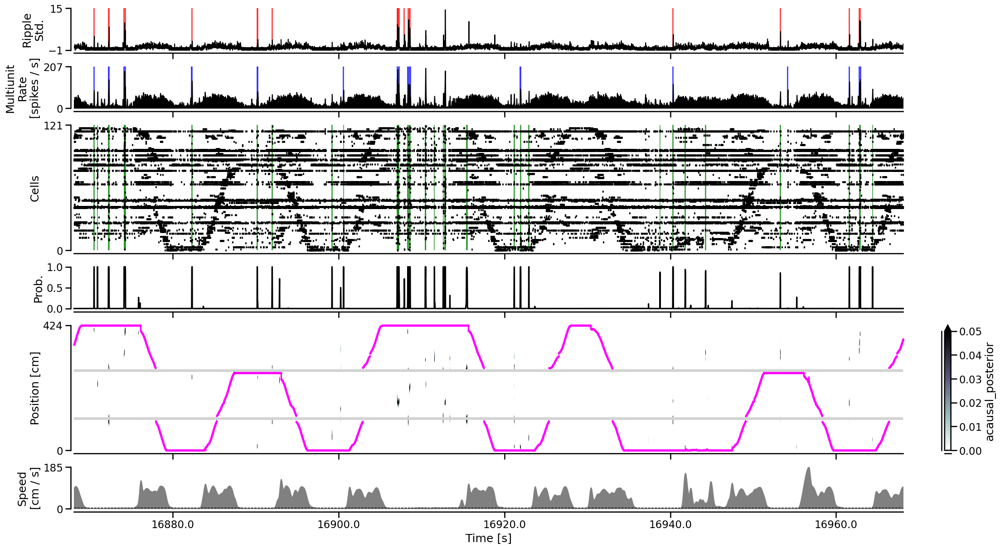

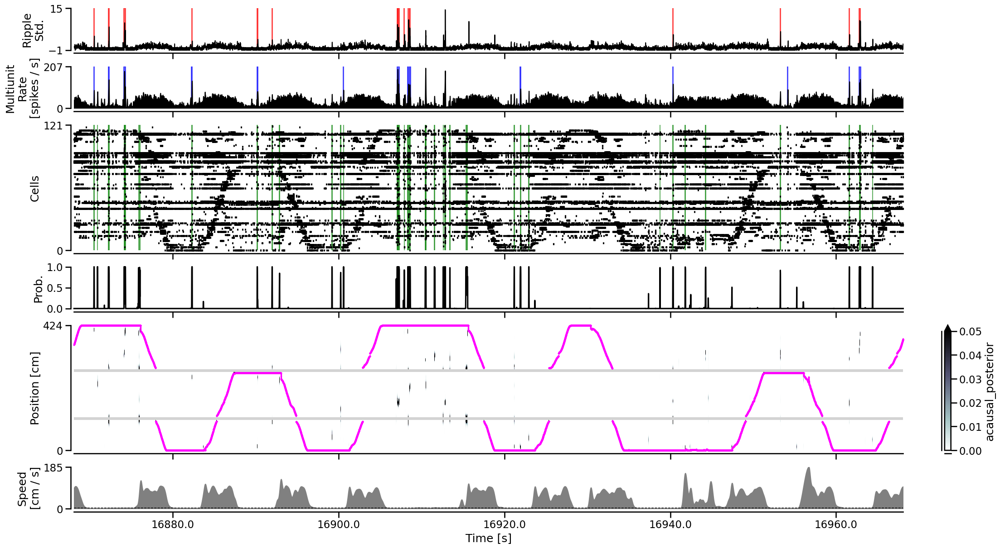

In [140]:
time_slice = slice(250_000, 300_000)
plot_detector(time_slice, data, detector_sorted_spikes[0], results_sorted_spikes[0], figsize=(22, 12.0))
plot_detector(time_slice, data, detector_sorted_spikes[-1], results_sorted_spikes[-1], figsize=(22, 12.0))

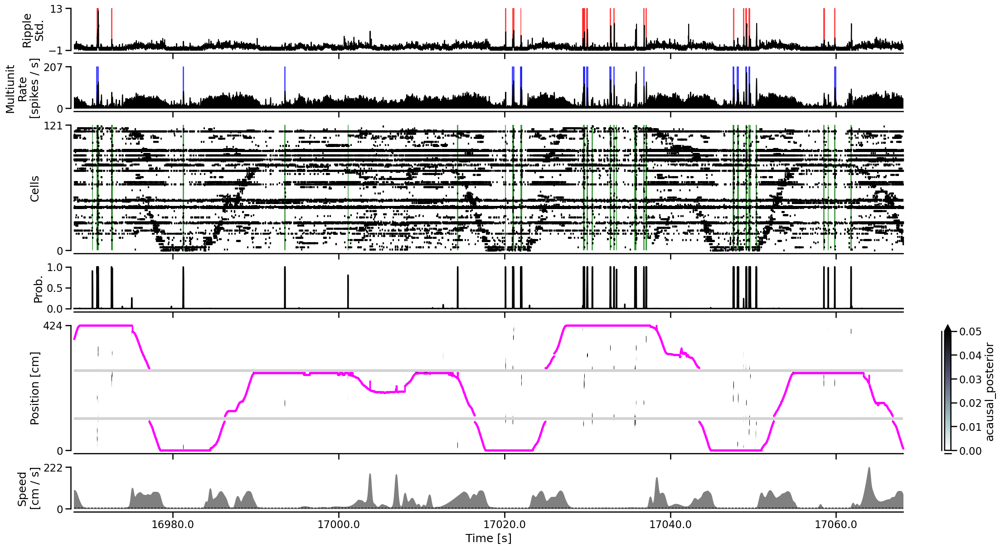

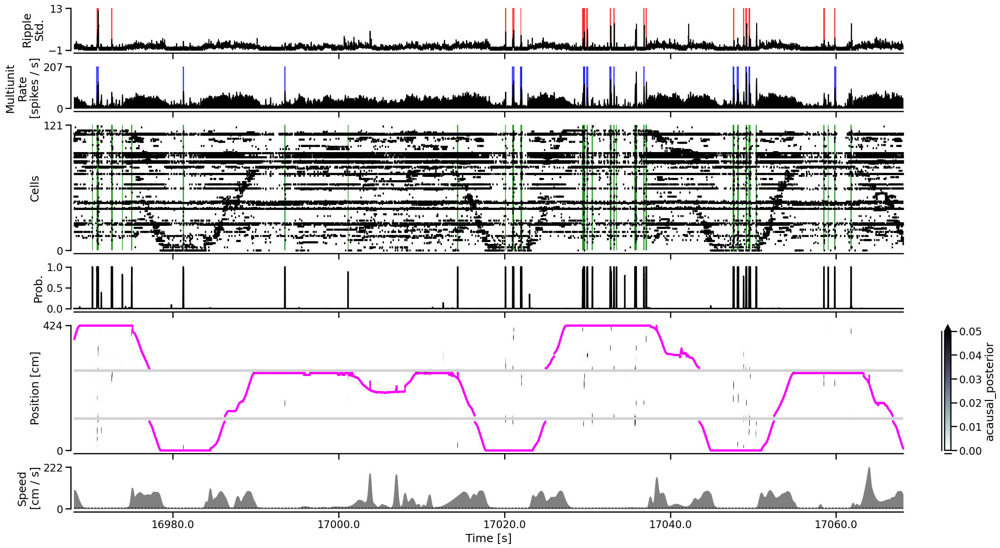

In [141]:
time_slice = slice(300_000, 350_000)
plot_detector(time_slice, data, detector_sorted_spikes[0], results_sorted_spikes[0], figsize=(22, 12.0))
plot_detector(time_slice, data, detector_sorted_spikes[-1], results_sorted_spikes[-1], figsize=(22, 12.0))

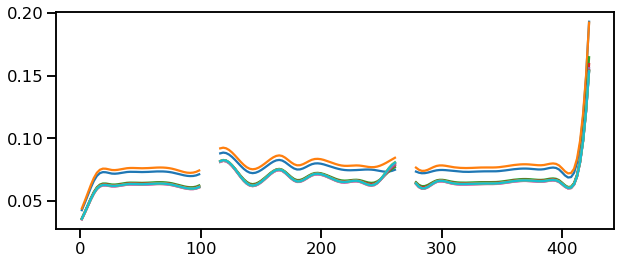

In [135]:
def plot_place_field(detector, neuron_ind=0):
    place_conditional_intensity = (
        detector._spiking_likelihood
        .keywords['place_conditional_intensity']).squeeze().copy()
    is_track_interior = detector.is_track_interior_
    place_conditional_intensity[~is_track_interior] = np.nan
    plt.plot(detector.place_bin_centers_,
             place_conditional_intensity[:, neuron_ind] * 500)
    
plt.figure(figsize=(10, 4))
for detector in detector_sorted_spikes:
    plot_place_field(detector, neuron_ind=120)

In [146]:
detector = detector_sorted_spikes

place_conditional_intensity_initial = (
    detector[0]._spiking_likelihood
    .keywords['place_conditional_intensity']).squeeze().copy()
place_conditional_intensity_last = (
    detector[-1]._spiking_likelihood
    .keywords['place_conditional_intensity']).squeeze().copy()
is_track_interior = detector[0].is_track_interior_

place_change = np.linalg.norm(
    place_conditional_intensity_last[is_track_interior] -
    place_conditional_intensity_initial[is_track_interior], axis=0)
np.argsort(place_change)

array([ 88, 111,  54, 112,  32,   8,  14,  68,  78,  36,  86, 108,  73,
        58,  57,  12, 120,  53, 109,  38,   6,  13,  90,  15,  42,   1,
         9,  23,   2, 114,  47,  63,  41,  44,  96,  10,  97,  45, 118,
        77,  25,  93, 106,  20,  19, 113,  76,  92,  59,   5,  72,  49,
        89,  35,  21,  27,  40,  56,  64, 103,  95,  17,  84,  83,  94,
        48,  61,  46,  52,  79,  16,  31, 105,  87,  34,   7, 119,  22,
        18,  81,  80,   3, 110, 115, 116,  24, 100,  67,  70,  74,  71,
        11, 104,  39,  29,   4,  65,  37,  66,  85,  55,  62,  75,  26,
        30, 117,  33, 107,  51,  28,  60,  98,  99,  50, 102,  91,  69,
         0, 101,  82,  43])

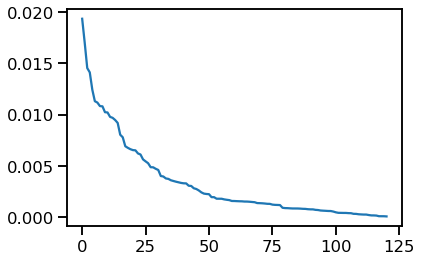

In [121]:
plt.plot(place_change[np.argsort(place_change)[::-1]])

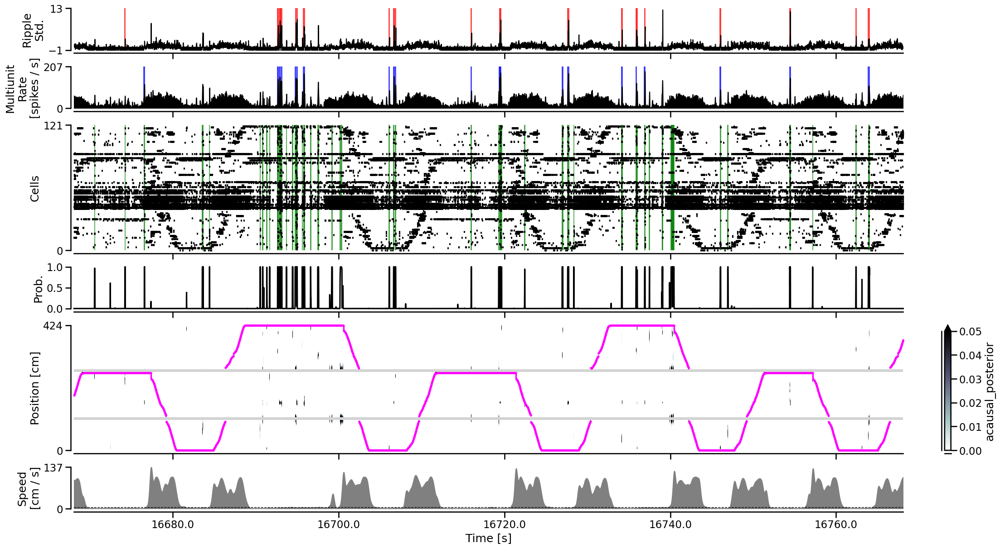

In [18]:
time_slice = slice(150_000, 200_000)
plot_detector(time_slice, data, detector, results, figsize=(22, 12.0))

In [ ]:
data_log_likelihood_sorted_spikes2 = []
detector_sorted_spikes2 = []
results_sorted_spikes2 = []

for i in range(10):
    print(i)
    if i == 0:
        is_training = np.asarray(~data['is_ripple'].values.squeeze()).astype(float)
    else:
        is_training = ((1 - results.non_local_probability) > 0.8).astype(float).values
        
    detector, results = predict_spikes(is_training)
    data_log_likelihood_sorted_spikes2.append(results.data_log_likelihood)
    detector_sorted_spikes2.append(detector)
    results_sorted_spikes2.append(results)

13-Feb-22 21:04:32 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
               replay_state_transition_penalty=1e-05, speed_knots=None,
               speed_threshold=4.0, spike_mode

0


13-Feb-22 21:04:33 Fitting spiking model...


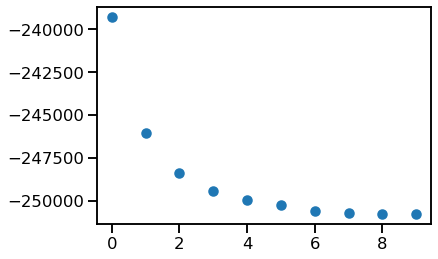

In [196]:
plt.scatter(np.arange(10), np.asarray(data_log_likelihood_sorted_spikes2))

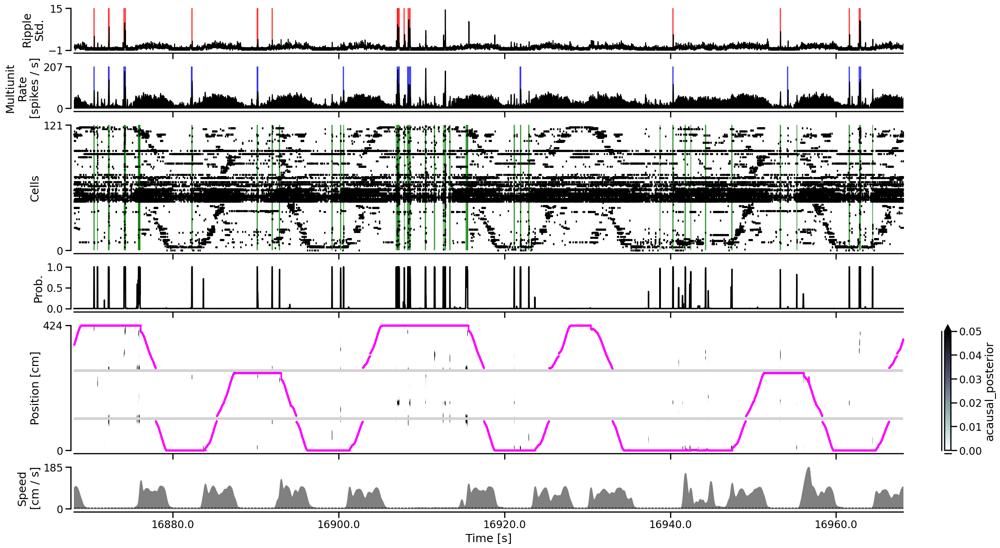

In [13]:
time_slice = slice(250_000, 300_000)
plot_detector(time_slice, data, detector_sorted_spikes2[-1], results_sorted_spikes2[-1], figsize=(22, 12.0))

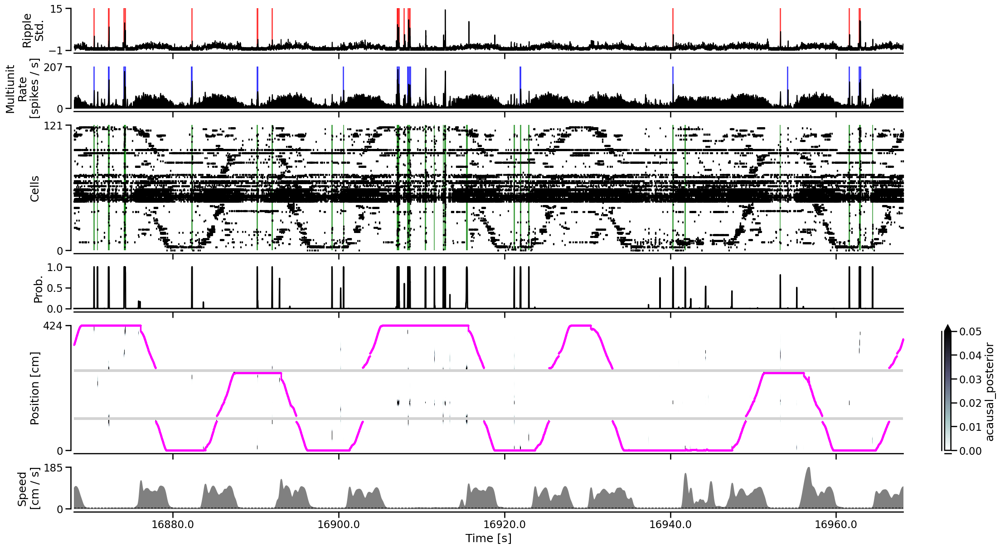

In [14]:
time_slice = slice(250_000, 300_000)
plot_detector(time_slice, data, detector_sorted_spikes2[0], results_sorted_spikes2[0], figsize=(22, 12.0))

(100000.0, 300000.0)

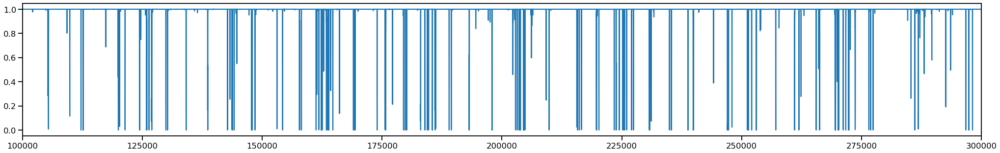

In [21]:
plt.figure(figsize=(35, 5))
plt.plot(1 - results_sorted_spikes2[0].non_local_probability)
plt.xlim((100_000, 300_000))

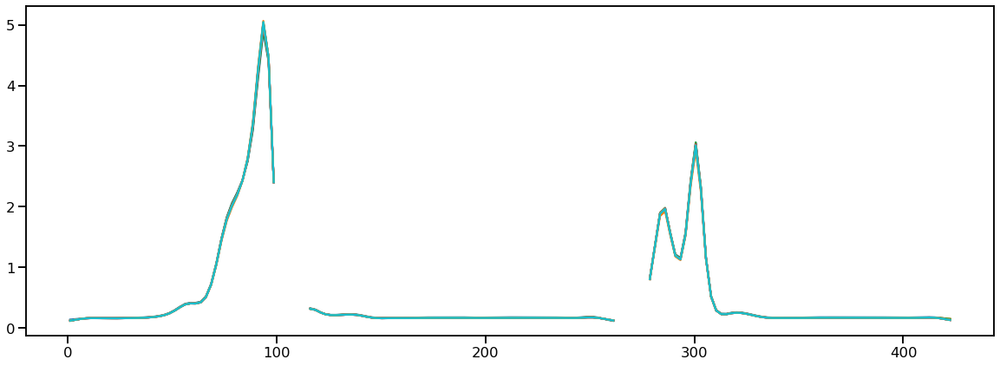

In [295]:


def plot_place_field(detector, neuron_ind=0, ax=None):
    if ax is None:
        ax = plt.gca()
    place_conditional_intensity = (
        detector._spiking_likelihood
        .keywords['place_conditional_intensity']).squeeze().copy()
    is_track_interior = detector.is_track_interior_
    place_conditional_intensity[~is_track_interior] = np.nan
    plt.plot(detector.place_bin_centers_,
             place_conditional_intensity[:, neuron_ind] * 500)
    
plt.figure(figsize=(20, 7))
for detector in detector_sorted_spikes2:
    plot_place_field(detector, neuron_ind=42)

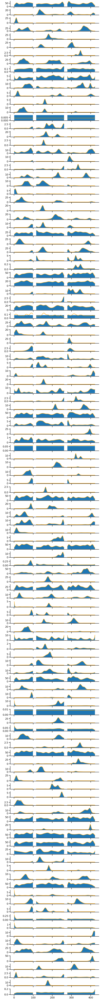

In [137]:
import seaborn as sns


def plot_place_fields(detectors, iteration=-1):
    place_fields = (
        detectors[0]._spiking_likelihood
        .keywords['place_conditional_intensity']).squeeze().copy()
    is_track_interior = detectors[0].is_track_interior_
    place_fields[~is_track_interior] = np.nan
    
    place_fields2 = (
        detectors[iteration]._spiking_likelihood
        .keywords['place_conditional_intensity']).squeeze().copy()
    is_track_interior = detectors[iteration].is_track_interior_
    place_fields2[~is_track_interior] = np.nan
    
    n_neurons = place_fields.shape[1]
    fig, axes = plt.subplots(n_neurons, 1, figsize=(9, 0.75 * n_neurons),
                             sharex=True, constrained_layout=True)

    for neuron_ind, ax in enumerate(axes.flat):
        ax.fill_between(detectors[0].place_bin_centers_.squeeze(),
                        place_fields[:, neuron_ind] * 500, alpha=1)
        ax.plot(detectors[iteration].place_bin_centers_.squeeze(),
                 place_fields2[:, neuron_ind] * 500, alpha=1, color='orange')
    sns.despine()
    
plot_place_fields(detector_sorted_spikes)    

In [136]:
plot_place_fields(detector_sorted_spikes2)

NameError: name 'plot_place_fields' is not defined

In [ ]:
data_log_likelihood_sorted_spikes3 = []
detector_sorted_spikes3 = []
results_sorted_spikes3 = []

for i in range(10):
    print(i)
    is_training = np.asarray(~data['is_ripple'].values.squeeze()).astype(float)
        
    detector, results = predict_spikes(is_training)
    data_log_likelihood_sorted_spikes3.append(results.data_log_likelihood)
    detector_sorted_spikes3.append(detector)
    results_sorted_spikes3.append(results)

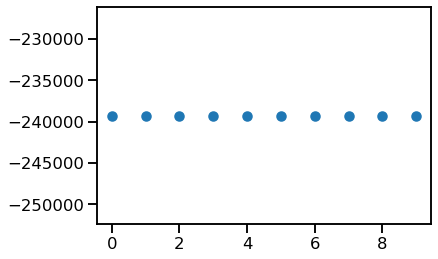

In [197]:
plt.scatter(np.arange(10), np.asarray(data_log_likelihood_sorted_spikes3))

In [61]:
from scipy.signal import filtfilt, hilbert
from scipy.fftpack import next_fast_len

import pandas as pd
from loren_frank_data_processing.core import reconstruct_time
from scipy.io import loadmat
import os
from src.parameters import ANIMALS


def get_gnd_tetrode_filename(tetrode_key, animals):
    '''Returns a file name for the filtered LFP for an epoch.
    Parameters
    ----------
    tetrode_key : tuple
        Unique key identifying the tetrode. Elements are
        (animal_short_name, day, epoch, tetrode_number).
    animals : dict of named-tuples
        Dictionary containing information about the directory for each
        animal. The key is the animal_short_name.
    Returns
    -------
    filename : str
        File path to tetrode file LFP
    '''
    animal, day, epoch, tetrode_number = tetrode_key
    # add eeggnd to filename to get correct theta from a reference ntrode
    filename = (f'{animals[animal].short_name}eeggnd{day:02d}'
                f'-{epoch}-{tetrode_number:02d}.mat')
    return os.path.join(animals[animal].directory, 'EEG', filename)

def _get_thetafilter_kernel():
    '''Returns the pre-computed theta filter kernel from the Frank lab.
    The kernel is 150-250 Hz bandpass with 40 db roll off and 10 Hz
    sidebands. Sampling frequency is 1500 Hz.
    '''
    filter_file = '../src/thetafilter_5_11_1500.mat'
    thetafilter = loadmat(filter_file)
    return thetafilter['thetafilter_5_11_1500']['kernel'][0][0].flatten(), 1
                                                      
def filter_theta_band(data):
    '''Returns a bandpass filtered signal between 150-250 Hz

    Parameters
    ----------
    data : array_like, shape (n_time,)

    Returns
    -------
    filtered_data : array_like, shape (n_time,)

    '''
    filter_numerator, filter_denominator = _get_thetafilter_kernel()
    is_nan = np.any(np.isnan(data), axis=-1)
    filtered_data = np.full_like(data, np.nan)
    filtered_data[~is_nan] = filtfilt(
        filter_numerator, filter_denominator, data[~is_nan], axis=0)
    return filtered_data
    
def get_gnd_LFP_dataframe(tetrode_key, animals):
    '''Gets the LFP data for a given epoch and tetrode.

    Parameters
    ----------
    tetrode_key : tuple
        Unique key identifying the tetrode. Elements are
        (animal_short_name, day, epoch, tetrode_number).
    animals : dict of named-tuples
        Dictionary containing information about the directory for each
        animal. The key is the animal_short_name.

    Returns
    -------
    LFP : pandas dataframe
        Contains the electric potential and time
    '''
    try:
        lfp_file = loadmat(get_gnd_tetrode_filename(tetrode_key, ANIMALS))
        lfp_data = lfp_file['eeggnd'][0, -1][0, -1][0, -1]
        lfp_time = reconstruct_time(
            lfp_data['starttime'][0, 0].item(),
            lfp_data['data'][0, 0].size,
            float(lfp_data['samprate'][0, 0].squeeze()))
        return pd.Series(
            data=lfp_data['data'][0, 0].squeeze().astype(float),
            index=lfp_time,
            name='{0}_{1:02d}_{2:02}_{3:03}'.format(*tetrode_key))
    except (FileNotFoundError, TypeError):
        logger.warning('Failed to load file: {0}'.format(
            get_LFP_filename(tetrode_key, animals)))


tetrode_key = data['tetrode_info'].loc[data['tetrode_info'].suparea == 'cc'].index[0]

gnd_lfp = get_gnd_LFP_dataframe(tetrode_key, ANIMALS)
theta_filtered_lfp = filter_theta_band(gnd_lfp[:, np.newaxis])

axis = 0 

is_nan = np.isnan(theta_filtered_lfp)
n_samples = theta_filtered_lfp[~is_nan].shape[axis]
phase_angle = np.full_like(theta_filtered_lfp, np.nan)
phase_angle[~is_nan] = np.angle(hilbert(theta_filtered_lfp[~is_nan], axis=axis))

is_descending = (phase_angle >= 0.0).squeeze()
is_descending = pd.Series(is_descending, index=gnd_lfp.index)
new_index = pd.Index(
    np.unique(np.concatenate((data['position_info'].index, is_descending.index))), name="time"
)
is_descending = (
    is_descending.reindex(index=new_index)
    .interpolate(method="pad")
    .reindex(index=data['position_info'].index)
)
is_training_theta = ~((is_descending.squeeze() & (data['position_info'].nose_vel > 4).squeeze()) | data['is_ripple'].squeeze())

In [243]:
from replay_identification import ReplayDetector
from src.parameters import WTRACK_EDGE_ORDER, WTRACK_EDGE_SPACING

detector_parameters2 = {
    'movement_var': 6.0,
    'replay_speed': 1,
    'place_bin_size': 2.5,
    'spike_model_knot_spacing': 12.5,
    'spike_model_penalty': 1E-5,
    'movement_state_transition_type': 'random_walk',
    'multiunit_model_kwargs': {
        'bandwidth': np.array([20.0, 20.0, 20.0, 20.0, 8.0])},
    'multiunit_occupancy_kwargs': {'bandwidth': np.array([8.0])},
    'discrete_state_transition_type': 'constant',
    'discrete_diagonal': np.asarray(
        [(is_training_theta.values[:-1] & ~is_training_theta.values[1:]).mean(),
         (is_training_theta.values[:-1] & is_training_theta.values[1:]).mean()])
}

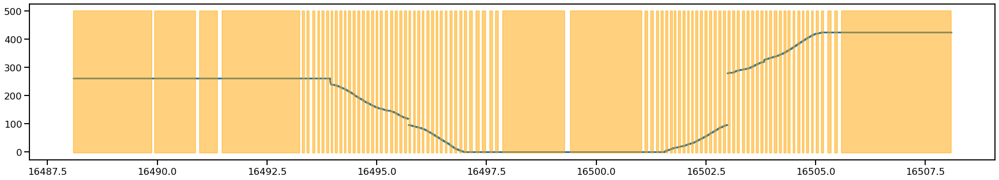

In [244]:
time_slice = slice(60_000, 70_000)

plt.figure(figsize=(30, 5))
plt.scatter(data['position_info'].iloc[time_slice].index / np.timedelta64(1, 's'), data['position_info'].iloc[time_slice].linear_position.values, s=1)
plt.fill_between(
    data['position_info'].iloc[time_slice].index / np.timedelta64(1, 's'),
    500 * is_training_theta.iloc[time_slice].values,
    color='orange',
    alpha=0.5,
    y2=-np.pi,
    where=is_training_theta.iloc[time_slice].values
)

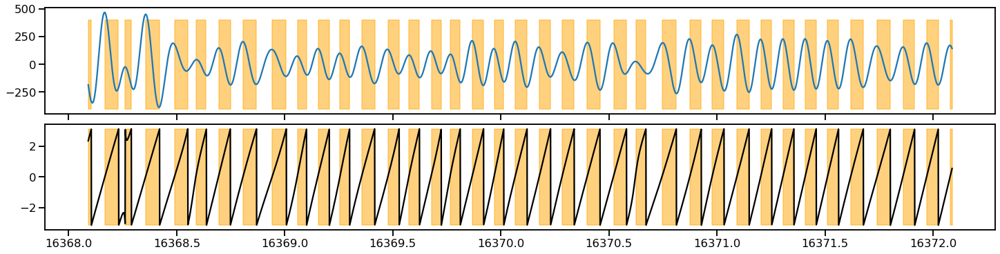

In [245]:
time_slice = slice(0, 2000)

fig, axes = plt.subplots(2, 1, sharex=True, constrained_layout=True, figsize=(20, 5))
axes[0].fill_between(data['position_info'].iloc[time_slice].index / np.timedelta64(1, 's'),
                     400 * is_descending.values[time_slice], color='orange',
                     alpha=0.5,
                     y2=-400,
                     where=is_descending.values[time_slice]
                    )
axes[0].plot(gnd_lfp.loc[time_slice2].index / np.timedelta64(1, 's'),
         pd.DataFrame(theta_filtered_lfp).set_index(gnd_lfp.index).loc[time_slice2].values)


axes[1].fill_between(
    data['position_info'].iloc[time_slice].index / np.timedelta64(1, 's'),
    np.pi * is_descending.values[time_slice],
    color='orange',
    alpha=0.5,
    y2=-np.pi,
    where=is_descending.values[time_slice]
)
time_slice2 = slice(data['position_info'].iloc[time_slice].index[0], data['position_info'].iloc[time_slice].index[-1])
axes[1].plot(
    gnd_lfp.loc[time_slice2].index / np.timedelta64(1, 's'),
    pd.DataFrame(phase_angle).set_index(gnd_lfp.index).loc[time_slice2].values, color='black')


In [336]:
data_log_likelihood_sorted_spikes_theta = []
detector_sorted_spikes_theta = []
results_sorted_spikes_theta = []

for i in range(10):
    print(i)
    if i == 0:
        is_training = is_training_theta.values.squeeze()
    else:
        is_training = ((1 - results.non_local_probability)).values
        
    detector, results = predict_spikes(is_training, detector_parameters2)
    data_log_likelihood_sorted_spikes_theta.append(results.data_log_likelihood)
    detector_sorted_spikes_theta.append(detector)
    results_sorted_spikes_theta.append(results)

16-Feb-22 18:05:30 ReplayDetector(discrete_diagonal=array([0.01061928, 0.68555555]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
               replay_state_transition_penalty=1e-05, speed_knots=None,
               speed_threshold=4.0, spike_model_knot_spacing=12.5,
               spike_model_penalt

0


16-Feb-22 18:05:30 Fitting speed model...
16-Feb-22 18:05:31 Fitting spiking model...
16-Feb-22 18:11:20 Fitting replay movement state transition...
16-Feb-22 18:11:20 Fitting replay state transition...
16-Feb-22 18:11:20 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

16-Feb-22 18:12:41 Finding causal non-local probability and position...
16-Feb-22 18:12:50 Finding acausal non-local probability and position...
16-Feb-22 18:13:17 Done!
16-Feb-22 18:13:18 ReplayDetector(discrete_diagonal=array([0.01061928, 0.68555555]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
  

1


16-Feb-22 18:13:18 Fitting speed model...
16-Feb-22 18:13:19 Fitting spiking model...
16-Feb-22 18:20:41 Fitting replay movement state transition...
16-Feb-22 18:20:42 Fitting replay state transition...
16-Feb-22 18:20:42 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

16-Feb-22 18:22:02 Finding causal non-local probability and position...
16-Feb-22 18:22:10 Finding acausal non-local probability and position...
16-Feb-22 18:22:39 Done!
16-Feb-22 18:22:39 ReplayDetector(discrete_diagonal=array([0.01061928, 0.68555555]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
  

2


16-Feb-22 18:22:39 Fitting speed model...
16-Feb-22 18:22:40 Fitting spiking model...
16-Feb-22 18:30:02 Fitting replay movement state transition...
16-Feb-22 18:30:02 Fitting replay state transition...
16-Feb-22 18:30:02 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

16-Feb-22 18:31:23 Finding causal non-local probability and position...
16-Feb-22 18:31:32 Finding acausal non-local probability and position...
16-Feb-22 18:32:06 Done!
16-Feb-22 18:32:06 ReplayDetector(discrete_diagonal=array([0.01061928, 0.68555555]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
  

3


16-Feb-22 18:32:06 Fitting speed model...
16-Feb-22 18:32:07 Fitting spiking model...
16-Feb-22 18:39:28 Fitting replay movement state transition...
16-Feb-22 18:39:28 Fitting replay state transition...
16-Feb-22 18:39:28 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

16-Feb-22 18:40:49 Finding causal non-local probability and position...
16-Feb-22 18:40:58 Finding acausal non-local probability and position...
16-Feb-22 18:41:30 Done!
16-Feb-22 18:41:30 ReplayDetector(discrete_diagonal=array([0.01061928, 0.68555555]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
  

4


16-Feb-22 18:41:31 Fitting speed model...
16-Feb-22 18:41:32 Fitting spiking model...
16-Feb-22 18:48:57 Fitting replay movement state transition...
16-Feb-22 18:48:57 Fitting replay state transition...
16-Feb-22 18:48:57 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

16-Feb-22 18:50:18 Finding causal non-local probability and position...
16-Feb-22 18:50:26 Finding acausal non-local probability and position...
16-Feb-22 18:51:01 Done!
16-Feb-22 18:51:01 ReplayDetector(discrete_diagonal=array([0.01061928, 0.68555555]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
  

5


16-Feb-22 18:51:01 Fitting speed model...
16-Feb-22 18:51:02 Fitting spiking model...
16-Feb-22 18:58:26 Fitting replay movement state transition...
16-Feb-22 18:58:27 Fitting replay state transition...
16-Feb-22 18:58:27 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

16-Feb-22 18:59:51 Finding causal non-local probability and position...
16-Feb-22 19:00:00 Finding acausal non-local probability and position...
16-Feb-22 19:00:31 Done!
16-Feb-22 19:00:31 ReplayDetector(discrete_diagonal=array([0.01061928, 0.68555555]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
  

6


16-Feb-22 19:00:31 Fitting speed model...
16-Feb-22 19:00:32 Fitting spiking model...
16-Feb-22 19:07:56 Fitting replay movement state transition...
16-Feb-22 19:07:57 Fitting replay state transition...
16-Feb-22 19:07:57 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

16-Feb-22 19:09:20 Finding causal non-local probability and position...
16-Feb-22 19:09:28 Finding acausal non-local probability and position...
16-Feb-22 19:10:02 Done!
16-Feb-22 19:10:02 ReplayDetector(discrete_diagonal=array([0.01061928, 0.68555555]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
  

7


16-Feb-22 19:10:02 Fitting speed model...
16-Feb-22 19:10:04 Fitting spiking model...
16-Feb-22 19:17:33 Fitting replay movement state transition...
16-Feb-22 19:17:33 Fitting replay state transition...
16-Feb-22 19:17:33 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

16-Feb-22 19:18:57 Finding causal non-local probability and position...
16-Feb-22 19:19:05 Finding acausal non-local probability and position...
16-Feb-22 19:19:39 Done!
16-Feb-22 19:19:39 ReplayDetector(discrete_diagonal=array([0.01061928, 0.68555555]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
  

8


16-Feb-22 19:19:39 Fitting speed model...
16-Feb-22 19:19:40 Fitting spiking model...
16-Feb-22 19:27:03 Fitting replay movement state transition...
16-Feb-22 19:27:04 Fitting replay state transition...
16-Feb-22 19:27:04 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

16-Feb-22 19:28:27 Finding causal non-local probability and position...
16-Feb-22 19:28:35 Finding acausal non-local probability and position...
16-Feb-22 19:29:09 Done!
16-Feb-22 19:29:09 ReplayDetector(discrete_diagonal=array([0.01061928, 0.68555555]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
  

9


16-Feb-22 19:29:09 Fitting speed model...
16-Feb-22 19:29:10 Fitting spiking model...
16-Feb-22 19:36:35 Fitting replay movement state transition...
16-Feb-22 19:36:36 Fitting replay state transition...
16-Feb-22 19:36:36 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

16-Feb-22 19:37:57 Finding causal non-local probability and position...
16-Feb-22 19:38:08 Finding acausal non-local probability and position...
16-Feb-22 19:38:41 Done!


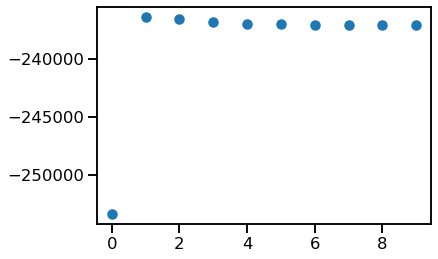

In [337]:
plt.scatter(np.arange(10), np.asarray(data_log_likelihood_sorted_spikes_theta))

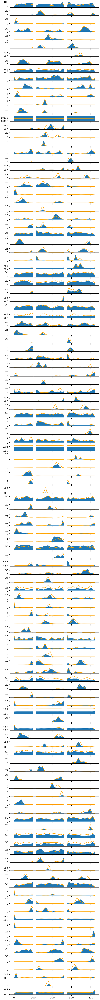

In [338]:
plot_place_fields(detector_sorted_spikes_theta)

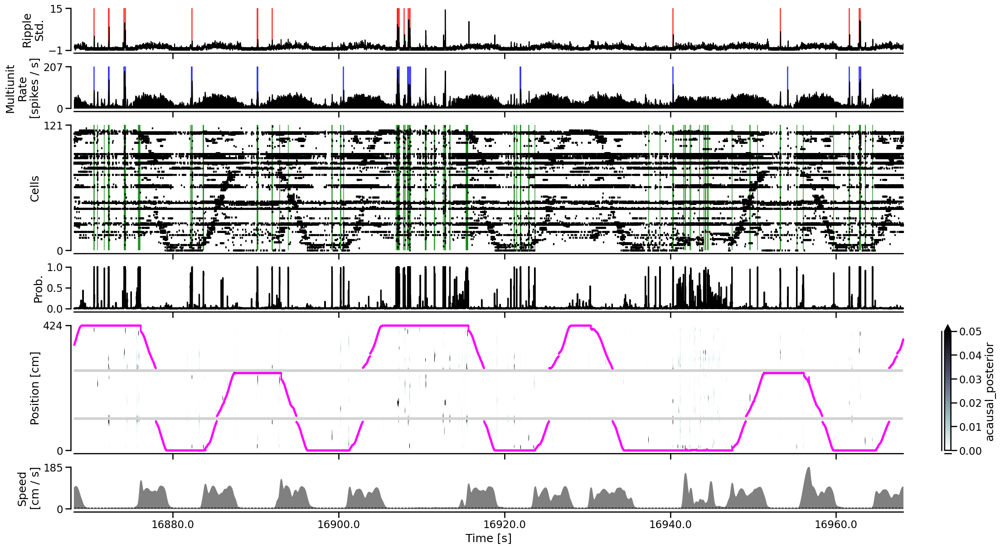

In [343]:
time_slice = slice(250_000, 300_000)
plot_detector(time_slice, data, detector_sorted_spikes_theta[-1], results_sorted_spikes_theta[-1], figsize=(22, 12.0))

In [341]:
def plot_place_fields2(detector1, detector2):
    place_fields = (
        detector1._spiking_likelihood
        .keywords['place_conditional_intensity']).squeeze().copy()
    is_track_interior = detector1.is_track_interior_
    place_fields[~is_track_interior] = np.nan
    
    place_fields2 = (
        detector2._spiking_likelihood
        .keywords['place_conditional_intensity']).squeeze().copy()
    is_track_interior = detector2.is_track_interior_
    place_fields2[~is_track_interior] = np.nan
    
    n_neurons = place_fields.shape[1]
    fig, axes = plt.subplots(n_neurons, 1, figsize=(9, 0.75 * n_neurons),
                             sharex=True, constrained_layout=True)

    for neuron_ind, ax in enumerate(axes.flat):
        ax.fill_between(detector1.place_bin_centers_.squeeze(),
                        place_fields[:, neuron_ind] * 500, alpha=1)
        ax.plot(detector2.place_bin_centers_.squeeze(),
                 place_fields2[:, neuron_ind] * 500, alpha=1, color='orange')
    sns.despine()

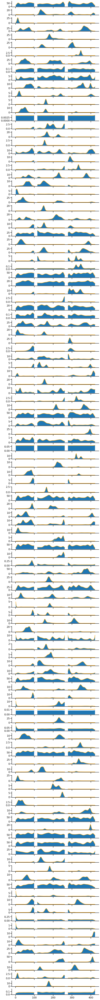

In [342]:
plot_place_fields2(detector_sorted_spikes[-1], detector_sorted_spikes_theta[-1])

In [246]:
is_training = is_training_theta.values.squeeze().astype(float)

replay_detector = ReplayDetector(**detector_parameters2)
logging.info(replay_detector)

replay_detector.fit(
    is_ripple=data['is_ripple'],
    is_training=is_training,
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    track_graph=data['track_graph'],
    edge_order=WTRACK_EDGE_ORDER,
    edge_spacing=WTRACK_EDGE_SPACING,
    use_gpu=True,
)

results = replay_detector.predict(
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    time=data['position_info'].index / np.timedelta64(1, 's'),
    use_likelihoods=['spikes'],
    use_acausal=True,
    set_no_spike_to_equally_likely=True,
    use_gpu=False,
)
logging.info('Done!')

15-Feb-22 16:41:50 ReplayDetector(discrete_diagonal=array([0.01061928, 0.68555555]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
               replay_state_transition_penalty=1e-05, speed_knots=None,
               speed_threshold=4.0, spike_model_knot_spacing=12.5,
               spike_model_penalt

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

15-Feb-22 16:49:01 Finding causal non-local probability and position...
15-Feb-22 16:49:10 Finding acausal non-local probability and position...
15-Feb-22 16:49:44 Done!


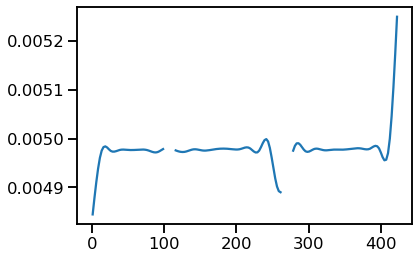

In [335]:
place_fields = (
    replay_detector._spiking_likelihood
    .keywords['place_conditional_intensity']).squeeze().copy()
is_track_interior = detector.is_track_interior_
place_fields[~is_track_interior] = np.nan

plt.plot(detector.place_bin_centers_, place_fields[:, 86] * 500)

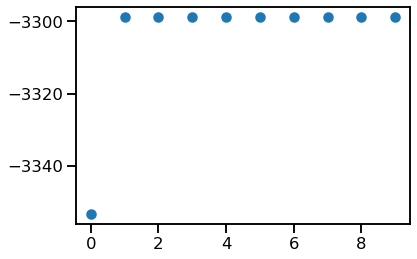

In [148]:
plt.scatter(np.arange(10), np.asarray(data_log_likelihood_sorted_spikes_theta))

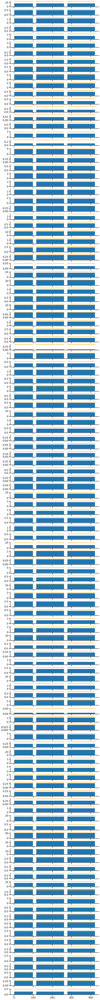

In [149]:
plot_place_fields(detector_sorted_spikes_theta)

In [10]:
data_log_likelihood_sorted_spikes_full = []
detector_sorted_spikes_full = []
results_sorted_spikes_full = []

for i in range(10):
    print(i)
    if i == 0:
        is_training = np.ones_like(data['position_info'].linear_position.squeeze())
    else:
        is_training = ((1 - results.non_local_probability)).values
        
    detector, results = predict_spikes(is_training, detector_parameters)
    data_log_likelihood_sorted_spikes_full.append(results.data_log_likelihood)
    detector_sorted_spikes_full.append(detector)
    results_sorted_spikes_full.append(results)

17-Feb-22 13:57:25 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
               replay_state_transition_penalty=1e-05, speed_knots=None,
               speed_threshold=4.0, spike_mode

0


17-Feb-22 13:57:25 Fitting speed model...
17-Feb-22 13:57:27 Fitting spiking model...
distributed.diskutils - INFO - Found stale lock file and directory '/stelmo/edeno/pose_analysis/notebooks/dask-worker-space/worker-i4q9ls2p', purging
distributed.diskutils - INFO - Found stale lock file and directory '/stelmo/edeno/pose_analysis/notebooks/dask-worker-space/worker-h012_gvw', purging
distributed.diskutils - INFO - Found stale lock file and directory '/stelmo/edeno/pose_analysis/notebooks/dask-worker-space/worker-ob2mry1x', purging
distributed.diskutils - INFO - Found stale lock file and directory '/stelmo/edeno/pose_analysis/notebooks/dask-worker-space/worker-6glybtp7', purging
distributed.diskutils - INFO - Found stale lock file and directory '/stelmo/edeno/pose_analysis/notebooks/dask-worker-space/worker-opzwdxsy', purging
distributed.diskutils - INFO - Found stale lock file and directory '/stelmo/edeno/pose_analysis/notebooks/dask-worker-space/worker-u27juqzt', purging
distributed.di

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

17-Feb-22 14:06:18 Finding causal non-local probability and position...
17-Feb-22 14:06:28 Finding acausal non-local probability and position...
17-Feb-22 14:07:01 Done!
17-Feb-22 14:07:01 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

1


17-Feb-22 14:07:01 Fitting speed model...
17-Feb-22 14:07:03 Fitting spiking model...
17-Feb-22 14:14:19 Fitting replay movement state transition...
17-Feb-22 14:14:20 Fitting replay state transition...
17-Feb-22 14:14:20 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

17-Feb-22 14:15:40 Finding causal non-local probability and position...
17-Feb-22 14:15:49 Finding acausal non-local probability and position...
17-Feb-22 14:16:22 Done!
17-Feb-22 14:16:22 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

2


17-Feb-22 14:16:22 Fitting speed model...
17-Feb-22 14:16:23 Fitting spiking model...
17-Feb-22 14:23:35 Fitting replay movement state transition...
17-Feb-22 14:23:35 Fitting replay state transition...
17-Feb-22 14:23:35 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

17-Feb-22 14:24:59 Finding causal non-local probability and position...
17-Feb-22 14:25:08 Finding acausal non-local probability and position...
17-Feb-22 14:25:45 Done!
17-Feb-22 14:25:45 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

3


17-Feb-22 14:25:45 Fitting speed model...
17-Feb-22 14:25:46 Fitting spiking model...
17-Feb-22 14:32:57 Fitting replay movement state transition...
17-Feb-22 14:32:58 Fitting replay state transition...
17-Feb-22 14:32:58 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

17-Feb-22 14:34:17 Finding causal non-local probability and position...
17-Feb-22 14:34:26 Finding acausal non-local probability and position...
17-Feb-22 14:34:58 Done!
17-Feb-22 14:34:58 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

4


17-Feb-22 14:34:59 Fitting spiking model...
17-Feb-22 14:42:14 Fitting replay movement state transition...
17-Feb-22 14:42:15 Fitting replay state transition...
17-Feb-22 14:42:15 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

17-Feb-22 14:43:33 Finding causal non-local probability and position...
17-Feb-22 14:43:42 Finding acausal non-local probability and position...
17-Feb-22 14:44:11 Done!
17-Feb-22 14:44:11 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

5


17-Feb-22 14:44:12 Fitting spiking model...
17-Feb-22 14:51:21 Fitting replay movement state transition...
17-Feb-22 14:51:22 Fitting replay state transition...
17-Feb-22 14:51:22 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

17-Feb-22 14:52:41 Finding causal non-local probability and position...
17-Feb-22 14:52:52 Finding acausal non-local probability and position...
17-Feb-22 14:53:25 Done!
17-Feb-22 14:53:25 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

6


17-Feb-22 14:53:25 Fitting speed model...
17-Feb-22 14:53:26 Fitting spiking model...
17-Feb-22 15:00:38 Fitting replay movement state transition...
17-Feb-22 15:00:38 Fitting replay state transition...
17-Feb-22 15:00:38 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

17-Feb-22 15:02:02 Finding causal non-local probability and position...
17-Feb-22 15:02:10 Finding acausal non-local probability and position...
17-Feb-22 15:02:45 Done!
17-Feb-22 15:02:45 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

7


17-Feb-22 15:02:45 Fitting speed model...
17-Feb-22 15:02:46 Fitting spiking model...
17-Feb-22 15:10:03 Fitting replay movement state transition...
17-Feb-22 15:10:04 Fitting replay state transition...
17-Feb-22 15:10:04 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

17-Feb-22 15:11:24 Finding causal non-local probability and position...
17-Feb-22 15:11:35 Finding acausal non-local probability and position...
17-Feb-22 15:12:04 Done!
17-Feb-22 15:12:04 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

8


17-Feb-22 15:12:04 Fitting speed model...
17-Feb-22 15:12:05 Fitting spiking model...
17-Feb-22 15:19:20 Fitting replay movement state transition...
17-Feb-22 15:19:20 Fitting replay state transition...
17-Feb-22 15:19:20 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

17-Feb-22 15:20:40 Finding causal non-local probability and position...
17-Feb-22 15:20:50 Finding acausal non-local probability and position...
17-Feb-22 15:21:20 Done!
17-Feb-22 15:21:20 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 20.0,
                                       'position_std': 8.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place

9


17-Feb-22 15:21:22 Fitting spiking model...
17-Feb-22 15:28:41 Fitting replay movement state transition...
17-Feb-22 15:28:41 Fitting replay state transition...
17-Feb-22 15:28:41 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

17-Feb-22 15:30:02 Finding causal non-local probability and position...
17-Feb-22 15:30:13 Finding acausal non-local probability and position...
17-Feb-22 15:30:48 Done!


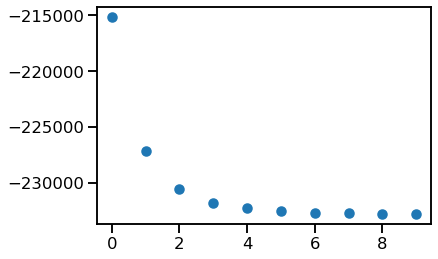

In [346]:
plt.scatter(np.arange(10), np.asarray(data_log_likelihood_sorted_spikes_full))

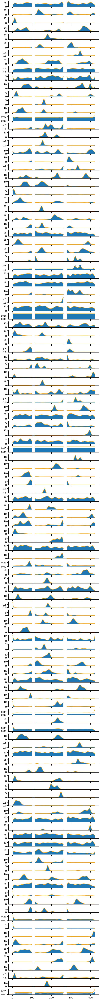

In [348]:
plot_place_fields2(detector_sorted_spikes[0], detector_sorted_spikes_full[0])

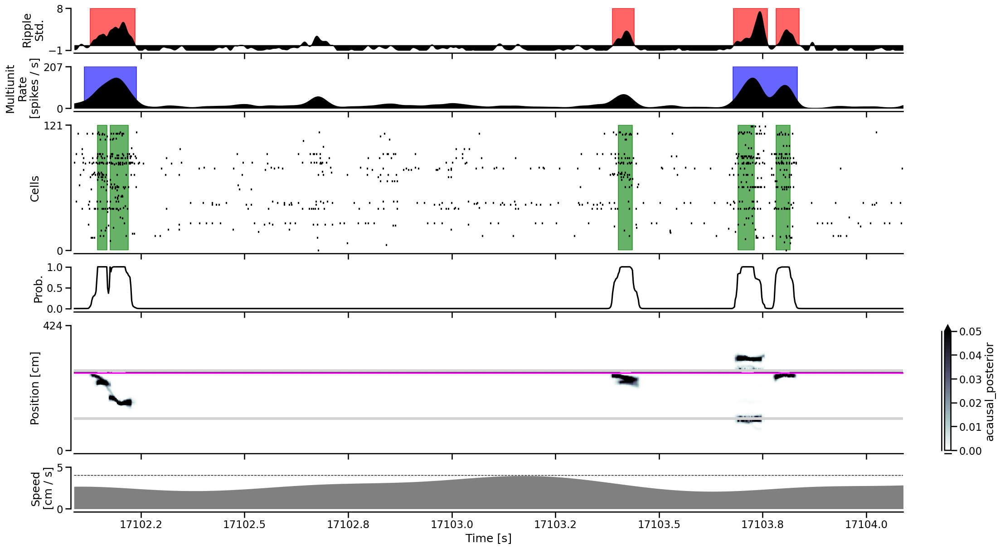

In [357]:
time_slice = slice(367_000, 368_000)
plot_detector(time_slice, data, detector_sorted_spikes_full[-1], results_sorted_spikes_full[-1], figsize=(22, 12.0))

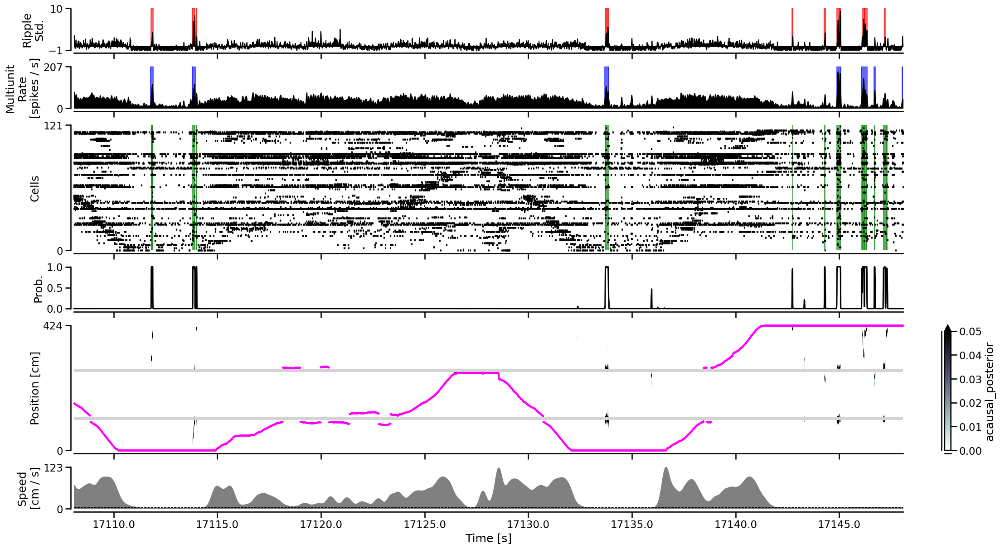

In [358]:
time_slice = slice(370_000, 390_000)
plot_detector(time_slice, data, detector_sorted_spikes_full[-1], results_sorted_spikes_full[-1], figsize=(22, 12.0))

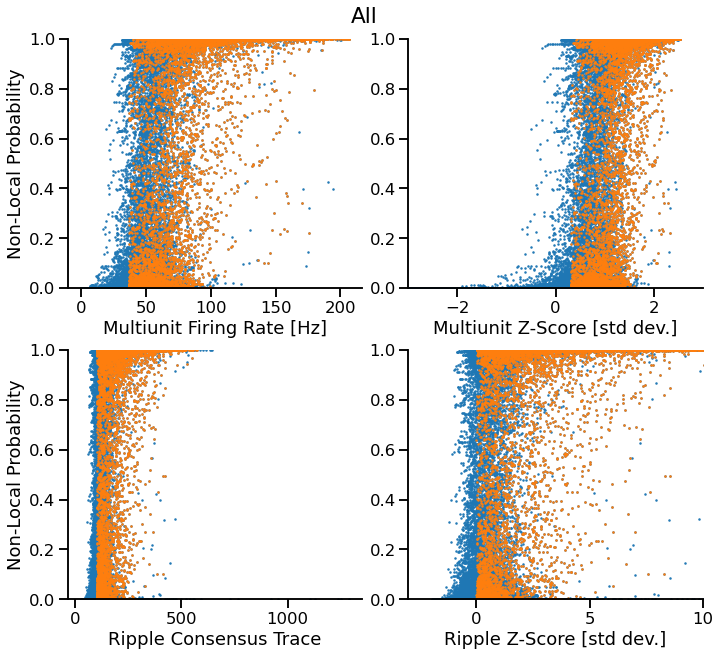

In [123]:
import seaborn as sns

fig, axes = plt.subplots(2, 2, constrained_layout=True, figsize=(10, 9))
axes[0, 0].scatter(data['multiunit_firing_rate'], results_sorted_spikes_full[-1].non_local_probability, s=1)
axes[0, 0].scatter(data['multiunit_firing_rate'].loc[data['is_multiunit_high_synchrony'].squeeze()],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['is_multiunit_high_synchrony'].values.squeeze()], s=1)

axes[0, 0].set_xlabel('Multiunit Firing Rate [Hz]')
axes[0, 0].set_ylabel('Non-Local Probability')
axes[0, 0].set_ylim((0, 1))

axes[0, 1].scatter(data['multiunit_rate_zscore'], results_sorted_spikes_full[-1].non_local_probability, s=1)
axes[0, 1].scatter(data['multiunit_rate_zscore'].loc[data['is_multiunit_high_synchrony'].squeeze()],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['is_multiunit_high_synchrony'].values.squeeze()], s=1)

axes[0, 1].set_xlim((-3, 3))
axes[0, 1].set_xlabel('Multiunit Z-Score [std dev.]')
axes[0, 1].set_ylim((0, 1))


new_index = pd.Index(np.unique(np.concatenate(
    (data['position_info'].index,  data['ripple_consensus_trace'].index))), name='time')
ripple_consensus_trace = (data['ripple_consensus_trace']
               .reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=data['position_info'].index))
new_index = pd.Index(np.unique(np.concatenate(
    (data['position_info'].index,  data['ripple_consensus_trace_zscore'].index))), name='time')
ripple_consensus_trace_zscore = (data['ripple_consensus_trace_zscore']
               .reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=data['position_info'].index))


axes[1, 0].scatter(ripple_consensus_trace, results_sorted_spikes_full[-1].non_local_probability, s=1)
axes[1, 0].scatter(ripple_consensus_trace.loc[data['is_ripple'].squeeze()],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['is_ripple'].values.squeeze()], s=1)

axes[1, 0].set_xlabel('Ripple Consensus Trace')
axes[1, 0].set_ylabel('Non-Local Probability')
axes[1, 0].set_ylim((0, 1))

axes[1, 1].scatter(ripple_consensus_trace_zscore, results_sorted_spikes_full[-1].non_local_probability, s=1)
axes[1, 1].scatter(ripple_consensus_trace_zscore.loc[data['is_ripple'].squeeze()],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['is_ripple'].values.squeeze()], s=1)

axes[1, 1].set_xlim((-3, 10))
axes[1, 1].set_xlabel('Ripple Z-Score [std dev.]')
axes[1, 1].set_ylim((0, 1))
plt.suptitle('All')

sns.despine()

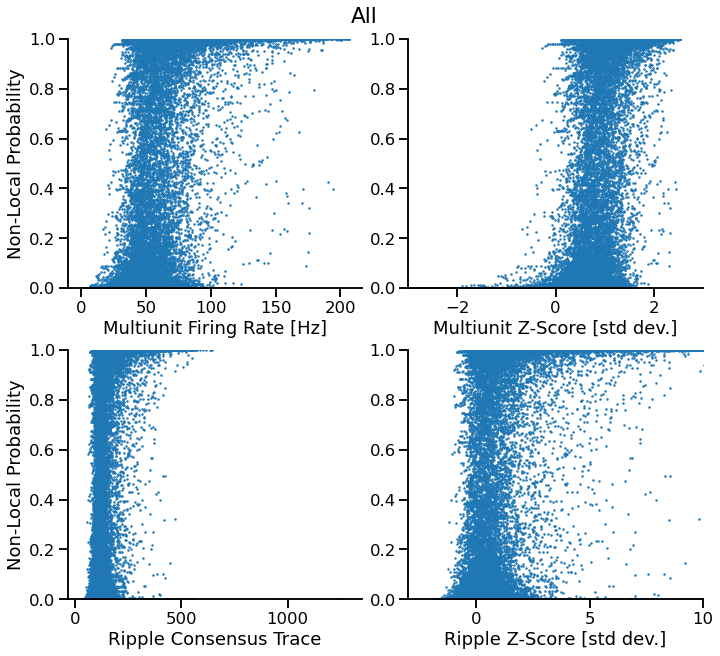

In [124]:
import seaborn as sns

fig, axes = plt.subplots(2, 2, constrained_layout=True, figsize=(10, 9))
axes[0, 0].scatter(data['multiunit_firing_rate'], results_sorted_spikes_full[-1].non_local_probability, s=1)

axes[0, 0].set_xlabel('Multiunit Firing Rate [Hz]')
axes[0, 0].set_ylabel('Non-Local Probability')
axes[0, 0].set_ylim((0, 1))

axes[0, 1].scatter(data['multiunit_rate_zscore'], results_sorted_spikes_full[-1].non_local_probability, s=1)

axes[0, 1].set_xlim((-3, 3))
axes[0, 1].set_xlabel('Multiunit Z-Score [std dev.]')
axes[0, 1].set_ylim((0, 1))


new_index = pd.Index(np.unique(np.concatenate(
    (data['position_info'].index,  data['ripple_consensus_trace'].index))), name='time')
ripple_consensus_trace = (data['ripple_consensus_trace']
               .reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=data['position_info'].index))
new_index = pd.Index(np.unique(np.concatenate(
    (data['position_info'].index,  data['ripple_consensus_trace_zscore'].index))), name='time')
ripple_consensus_trace_zscore = (data['ripple_consensus_trace_zscore']
               .reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=data['position_info'].index))


axes[1, 0].scatter(ripple_consensus_trace, results_sorted_spikes_full[-1].non_local_probability, s=1)

axes[1, 0].set_xlabel('Ripple Consensus Trace')
axes[1, 0].set_ylabel('Non-Local Probability')
axes[1, 0].set_ylim((0, 1))

axes[1, 1].scatter(ripple_consensus_trace_zscore, results_sorted_spikes_full[-1].non_local_probability, s=1)

axes[1, 1].set_xlim((-3, 10))
axes[1, 1].set_xlabel('Ripple Z-Score [std dev.]')
axes[1, 1].set_ylim((0, 1))
plt.suptitle('All')

sns.despine()

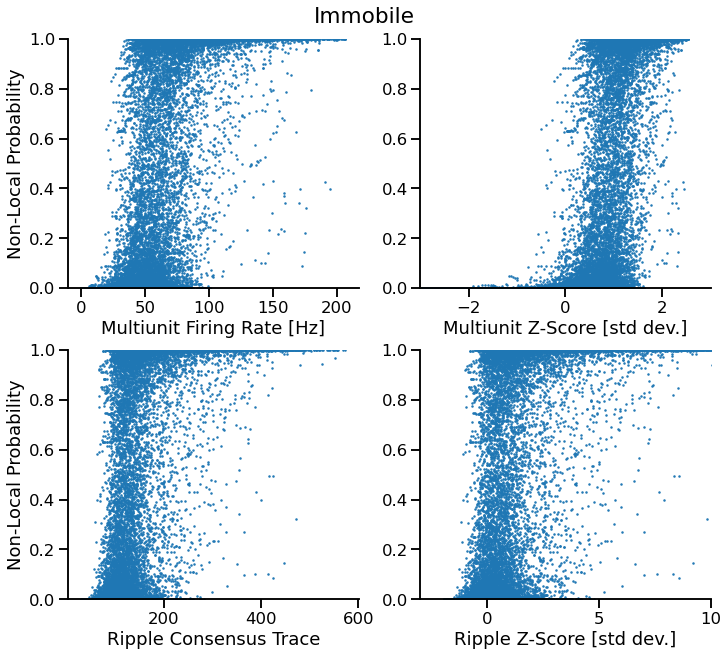

In [14]:
import seaborn as sns
import pandas as pd

fig, axes = plt.subplots(2, 2, constrained_layout=True, figsize=(10, 9))
axes[0, 0].scatter(data['multiunit_firing_rate'].values[data['position_info'].nose_vel < 4],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['position_info'].nose_vel < 4], s=1)

axes[0, 0].set_xlabel('Multiunit Firing Rate [Hz]')
axes[0, 0].set_ylabel('Non-Local Probability')
axes[0, 0].set_ylim((0, 1))

axes[0, 1].scatter(data['multiunit_rate_zscore'].values[data['position_info'].nose_vel < 4],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['position_info'].nose_vel < 4], s=1)

axes[0, 1].set_xlim((-3, 3))
axes[0, 1].set_xlabel('Multiunit Z-Score [std dev.]')
axes[0, 1].set_ylim((0, 1))


new_index = pd.Index(np.unique(np.concatenate(
    (data['position_info'].index,  data['ripple_consensus_trace'].index))), name='time')
ripple_consensus_trace = (data['ripple_consensus_trace']
               .reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=data['position_info'].index))
new_index = pd.Index(np.unique(np.concatenate(
    (data['position_info'].index,  data['ripple_consensus_trace_zscore'].index))), name='time')
ripple_consensus_trace_zscore = (data['ripple_consensus_trace_zscore']
               .reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=data['position_info'].index))


axes[1, 0].scatter(ripple_consensus_trace.values[data['position_info'].nose_vel < 4],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['position_info'].nose_vel < 4], s=1)

axes[1, 0].set_xlabel('Ripple Consensus Trace')
axes[1, 0].set_ylabel('Non-Local Probability')
axes[1, 0].set_ylim((0, 1))

axes[1, 1].scatter(ripple_consensus_trace_zscore.values[data['position_info'].nose_vel < 4],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['position_info'].nose_vel < 4], s=1)

axes[1, 1].set_xlim((-3, 10))
axes[1, 1].set_xlabel('Ripple Z-Score [std dev.]')
axes[1, 1].set_ylim((0, 1))

plt.suptitle('Immobile')
sns.despine()

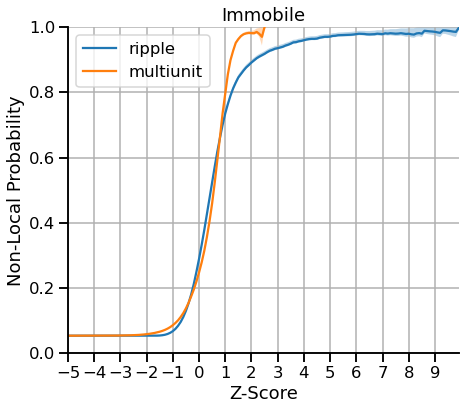

In [87]:
def std_dev_prob(x):
    return np.sqrt(np.asarray(x) * (1 - np.asarray(x)))

thresh_values = np.arange(-5, 10, 0.1)
is_immobile = data['position_info'].nose_vel.squeeze() <= 4

prob_non_local_by_thresh_ripple = [
    (results_sorted_spikes_full[-1].non_local_probability.values[is_immobile][ripple_consensus_trace_zscore.values.squeeze()[is_immobile] > thresh]).mean()
     for thresh in thresh_values]
n_samples_by_thresh_ripple = [
    (ripple_consensus_trace_zscore.values.squeeze()[is_immobile] > thresh).sum()
     for thresh in thresh_values]

prob_non_local_by_thresh_multiunit = [
    (results_sorted_spikes_full[-1].non_local_probability.values[is_immobile][data['multiunit_rate_zscore'].values.squeeze()[is_immobile] > thresh]).mean()
     for thresh in thresh_values]
n_samples_by_thresh_multiunit = [
    (data['multiunit_rate_zscore'].values.squeeze()[is_immobile] > thresh).sum()
     for thresh in thresh_values]

plt.figure(figsize=(7, 6))
plt.fill_between(thresh_values, prob_non_local_by_thresh_ripple - (std_dev_prob(prob_non_local_by_thresh_ripple) / np.sqrt(n_samples_by_thresh_ripple)),
                 prob_non_local_by_thresh_ripple + 1.96 * (std_dev_prob(prob_non_local_by_thresh_ripple)  / np.sqrt(n_samples_by_thresh_ripple)), alpha=0.3)
plt.plot(thresh_values, prob_non_local_by_thresh_ripple, label='ripple')

plt.fill_between(thresh_values, prob_non_local_by_thresh_multiunit - (std_dev_prob(prob_non_local_by_thresh_multiunit) / np.sqrt(n_samples_by_thresh_multiunit)),
                 prob_non_local_by_thresh_multiunit + 1.96 * (std_dev_prob(prob_non_local_by_thresh_multiunit)  / np.sqrt(n_samples_by_thresh_multiunit)), alpha=0.3)
plt.plot(thresh_values, prob_non_local_by_thresh_multiunit, label='multiunit')
plt.xticks(np.arange(thresh_values.min(), thresh_values.max()));
plt.title('Immobile')
plt.grid('on')
plt.legend()
plt.xlim((thresh_values.min(), thresh_values.max()))
plt.ylabel('Non-Local Probability')
plt.xlabel('Z-Score')
plt.ylim((0, 1))
sns.despine()

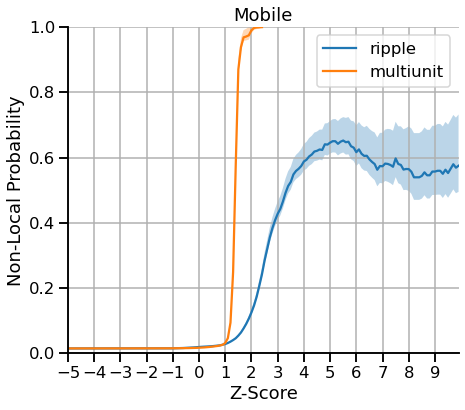

In [88]:
def std_dev_prob(x):
    return np.sqrt(np.asarray(x) * (1 - np.asarray(x)))

thresh_values = np.arange(-5, 10, 0.1)
is_mobile = data['position_info'].nose_vel.squeeze() > 4

prob_non_local_by_thresh_ripple = [
    (results_sorted_spikes_full[-1].non_local_probability.values[is_mobile][ripple_consensus_trace_zscore.values.squeeze()[is_mobile] > thresh]).mean()
     for thresh in thresh_values]
n_samples_by_thresh_ripple = [
    (ripple_consensus_trace_zscore.values.squeeze()[is_mobile] > thresh).sum()
     for thresh in thresh_values]

prob_non_local_by_thresh_multiunit = [
    (results_sorted_spikes_full[-1].non_local_probability.values[is_mobile][data['multiunit_rate_zscore'].values.squeeze()[is_mobile] > thresh]).mean()
     for thresh in thresh_values]
n_samples_by_thresh_multiunit = [
    (data['multiunit_rate_zscore'].values.squeeze()[is_mobile] > thresh).sum()
     for thresh in thresh_values]

plt.figure(figsize=(7, 6))
plt.fill_between(thresh_values, prob_non_local_by_thresh_ripple - (std_dev_prob(prob_non_local_by_thresh_ripple) / np.sqrt(n_samples_by_thresh_ripple)),
                 prob_non_local_by_thresh_ripple + 1.96 * (std_dev_prob(prob_non_local_by_thresh_ripple)  / np.sqrt(n_samples_by_thresh_ripple)), alpha=0.3)
plt.plot(thresh_values, prob_non_local_by_thresh_ripple, label='ripple')

plt.fill_between(thresh_values, prob_non_local_by_thresh_multiunit - (std_dev_prob(prob_non_local_by_thresh_multiunit) / np.sqrt(n_samples_by_thresh_multiunit)),
                 prob_non_local_by_thresh_multiunit + 1.96 * (std_dev_prob(prob_non_local_by_thresh_multiunit)  / np.sqrt(n_samples_by_thresh_multiunit)), alpha=0.3)
plt.plot(thresh_values, prob_non_local_by_thresh_multiunit, label='multiunit')
plt.xticks(np.arange(thresh_values.min(), thresh_values.max()));
plt.title('Mobile')
plt.grid('on')
plt.legend()
plt.xlim((thresh_values.min(), thresh_values.max()))
plt.ylabel('Non-Local Probability')
plt.xlabel('Z-Score')
plt.ylim((0, 1))
sns.despine()

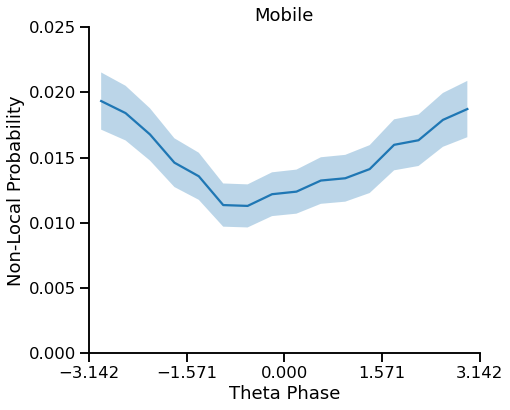

In [121]:
new_index = pd.Index(np.unique(np.concatenate(
    (data['position_info'].index,  data['ripple_consensus_trace'].index))), name='time')
downsampled_phase_angle = (pd.DataFrame(phase_angle).set_index(data['ripple_consensus_trace'].index)
               .reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=data['position_info'].index))

angle_range = np.arange(-np.pi, np.pi + np.pi/8, np.pi/8)
avg_non_local_by_angle = []
n_in_angle_range = []
for start_angle, stop_angle in zip(angle_range[:-1], angle_range[1:]):
    is_in_angle_range = (downsampled_phase_angle.values >= start_angle) & (downsampled_phase_angle.values < stop_angle)
    is_in_angle_range = is_in_angle_range.squeeze() & (data['position_info'].nose_vel.values.squeeze() > 4)
    n_in_angle_range.append(is_in_angle_range.sum())
    avg_non_local_by_angle.append(results_sorted_spikes_full[-1].non_local_probability.values[is_in_angle_range].mean())
    
plt.figure(figsize=(7, 6))
plt.fill_between(angle_range[:-1] + np.diff(angle_range) / 2,
                 avg_non_local_by_angle - 1.96 * (std_dev_prob(avg_non_local_by_angle) / np.sqrt(n_in_angle_range)),
                 avg_non_local_by_angle + 1.96 * (std_dev_prob(avg_non_local_by_angle) / np.sqrt(n_in_angle_range)),
                 alpha=0.3
                )
plt.plot(angle_range[:-1] + np.diff(angle_range) / 2, avg_non_local_by_angle)
plt.xticks(np.arange(-np.pi, np.pi + np.pi/2, np.pi/2));
plt.xlim((-np.pi, np.pi))
plt.ylim((0.0, 0.025))
plt.xlabel('Theta Phase')
plt.ylabel('Non-Local Probability')
plt.title('Mobile')
sns.despine()

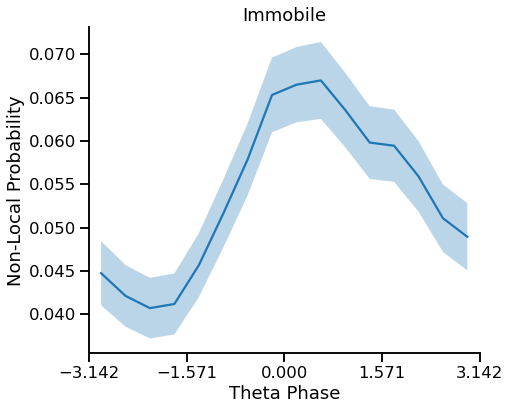

In [122]:
new_index = pd.Index(np.unique(np.concatenate(
    (data['position_info'].index,  data['ripple_consensus_trace'].index))), name='time')
downsampled_phase_angle = (pd.DataFrame(phase_angle).set_index(data['ripple_consensus_trace'].index)
               .reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=data['position_info'].index))

angle_range = np.arange(-np.pi, np.pi + np.pi/8, np.pi/8)
avg_non_local_by_angle = []
n_in_angle_range = []
for start_angle, stop_angle in zip(angle_range[:-1], angle_range[1:]):
    is_in_angle_range = (downsampled_phase_angle.values >= start_angle) & (downsampled_phase_angle.values < stop_angle)
    is_in_angle_range = is_in_angle_range.squeeze() & (data['position_info'].nose_vel.values.squeeze() <= 4)
    n_in_angle_range.append(is_in_angle_range.sum())
    avg_non_local_by_angle.append(results_sorted_spikes_full[-1].non_local_probability.values[is_in_angle_range].mean())
    
plt.figure(figsize=(7, 6))
plt.fill_between(angle_range[:-1] + np.diff(angle_range) / 2,
                 avg_non_local_by_angle - 1.96 * (std_dev_prob(avg_non_local_by_angle) / np.sqrt(n_in_angle_range)),
                 avg_non_local_by_angle + 1.96 * (std_dev_prob(avg_non_local_by_angle) / np.sqrt(n_in_angle_range)),
                 alpha=0.3
                )
plt.plot(angle_range[:-1] + np.diff(angle_range) / 2, avg_non_local_by_angle)
plt.xticks(np.arange(-np.pi, np.pi + np.pi/2, np.pi/2));
plt.xlim((-np.pi, np.pi))
plt.xlabel('Theta Phase')
plt.title('Immobile')
plt.ylabel('Non-Local Probability')
sns.despine()

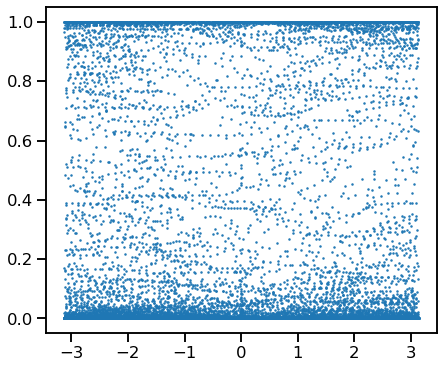

In [109]:
plt.figure(figsize=(7,  6))
plt.scatter(downsampled_phase_angle[is_mobile], results_sorted_spikes_full[-1].non_local_probability.values[is_mobile], s=1)

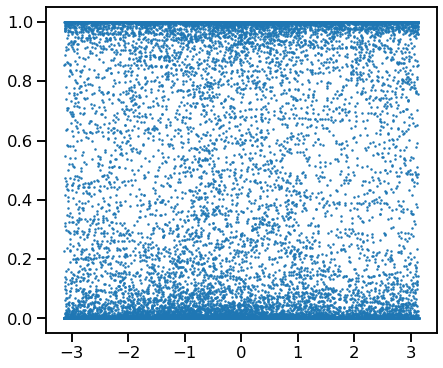

In [110]:
plt.figure(figsize=(7,  6))
plt.scatter(downsampled_phase_angle[is_immobile], results_sorted_spikes_full[-1].non_local_probability.values[is_immobile], s=1)

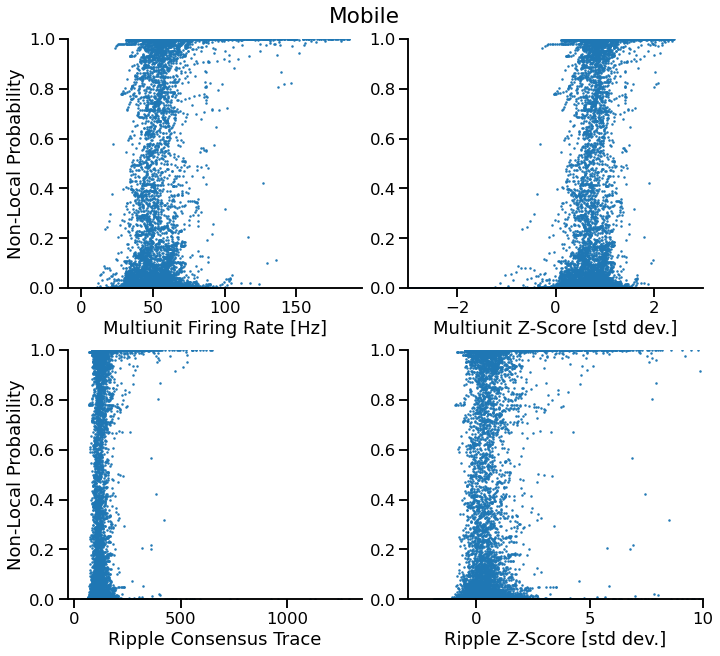

In [15]:
import seaborn as sns

fig, axes = plt.subplots(2, 2, constrained_layout=True, figsize=(10, 9))
axes[0, 0].scatter(data['multiunit_firing_rate'].values[data['position_info'].nose_vel >= 4],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['position_info'].nose_vel >= 4], s=1)

axes[0, 0].set_xlabel('Multiunit Firing Rate [Hz]')
axes[0, 0].set_ylabel('Non-Local Probability')
axes[0, 0].set_ylim((0, 1))

axes[0, 1].scatter(data['multiunit_rate_zscore'].values[data['position_info'].nose_vel >= 4],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['position_info'].nose_vel >= 4], s=1)

axes[0, 1].set_xlim((-3, 3))
axes[0, 1].set_xlabel('Multiunit Z-Score [std dev.]')
axes[0, 1].set_ylim((0, 1))


new_index = pd.Index(np.unique(np.concatenate(
    (data['position_info'].index,  data['ripple_consensus_trace'].index))), name='time')
ripple_consensus_trace = (data['ripple_consensus_trace']
               .reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=data['position_info'].index))
new_index = pd.Index(np.unique(np.concatenate(
    (data['position_info'].index,  data['ripple_consensus_trace_zscore'].index))), name='time')
ripple_consensus_trace_zscore = (data['ripple_consensus_trace_zscore']
               .reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=data['position_info'].index))


axes[1, 0].scatter(ripple_consensus_trace.values[data['position_info'].nose_vel >= 4],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['position_info'].nose_vel >= 4], s=1)

axes[1, 0].set_xlabel('Ripple Consensus Trace')
axes[1, 0].set_ylabel('Non-Local Probability')
axes[1, 0].set_ylim((0, 1))

axes[1, 1].scatter(ripple_consensus_trace_zscore.values[data['position_info'].nose_vel >= 4],
                   results_sorted_spikes_full[-1].non_local_probability.values[data['position_info'].nose_vel >= 4], s=1)

axes[1, 1].set_xlim((-3, 10))
axes[1, 1].set_xlabel('Ripple Z-Score [std dev.]')
axes[1, 1].set_ylim((0, 1))

plt.suptitle('Mobile')
sns.despine()

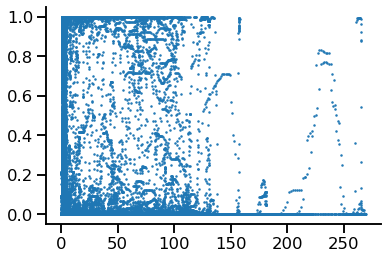

In [413]:
plt.scatter(data['position_info'].nose_vel, results_sorted_spikes_full[-1].non_local_probability.values, s=1)
sns.despine()

In [393]:
data['position_info'].columns

Index(['nose_x', 'nose_y', 'nose_vel', 'tailBase_x', 'tailBase_y',
       'tailBase_vel', 'tailMid_x', 'tailMid_y', 'tailMid_vel', 'tailTip_x',
       'tailTip_y', 'tailTip_vel', 'forepawL_x', 'forepawL_y', 'forepawL_vel',
       'forepawR_x', 'forepawR_y', 'forepawR_vel', 'hindpawL_x', 'hindpawL_y',
       'hindpawL_vel', 'hindpawR_x', 'hindpawR_y', 'hindpawR_vel',
       'forelimb_mid_x', 'forelimb_mid_y', 'forelimb_vel', 'body_dir',
       'linear_position', 'track_segment_id', 'projected_x_position',
       'projected_y_position', 'arm_name', 'labeled_segments', 'from_well',
       'to_well', 'task', 'is_correct', 'turn'],
      dtype='object')

In [403]:
new_index = pd.Index(np.unique(np.concatenate(
    (data['position_info'].index,  data['ripple_consensus_trace'].index))), name='time')
ripple_consensus_trace = (data['ripple_consensus_trace']
               .reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=data['position_info'].index))
ripple_consensus_trace

,ripple_consensus_trace
time,
0 days 04:32:48.089892304,131.998484
0 days 04:32:48.091892304,139.669604
0 days 04:32:48.093892304,146.588439
0 days 04:32:48.095892304,151.850867
0 days 04:32:48.097892304,154.373044
...,...
0 days 04:47:45.505892304,118.907026
0 days 04:47:45.507892304,119.927183
0 days 04:47:45.509892304,119.150666


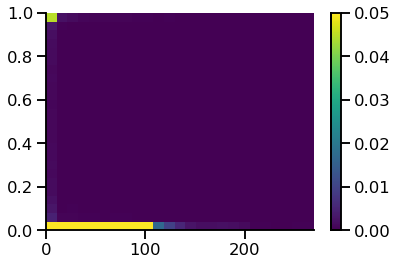

In [141]:
plt.hist2d(data['position_info'].nose_vel.values.squeeze(),
           results_sorted_spikes_full[-1].non_local_probability.values.squeeze(),
           bins=25,
           density=True, vmin=0.0,
           vmax=0.05);
plt.colorbar()
sns.despine()

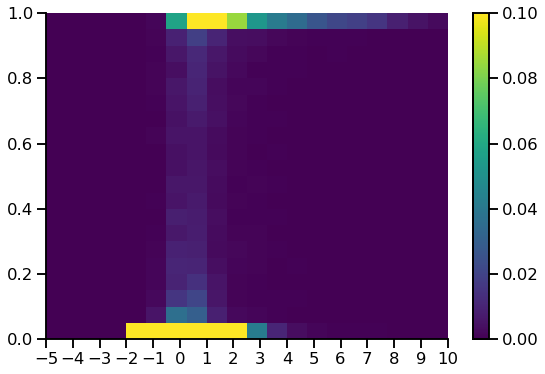

In [156]:
plt.figure(figsize=(9, 6))
plt.hist2d(ripple_consensus_trace_zscore.values.squeeze(),
           results_sorted_spikes_full[-1].non_local_probability.values.squeeze(),
           bins=20,
           density=True,
           vmin=0.0,
           vmax=0.1,
           range=[[-5, 10], [0.0, 1.0]]
          );
plt.xticks(np.arange(-5, 11, 1))
plt.colorbar()
sns.despine()

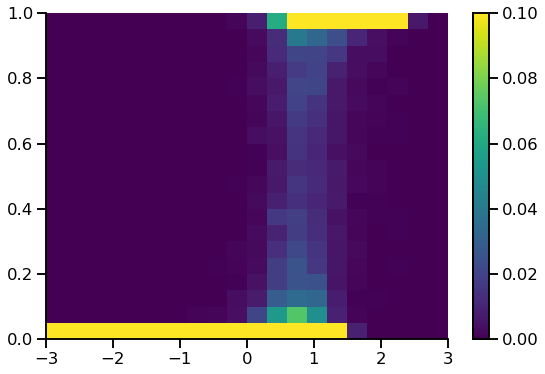

In [158]:
plt.figure(figsize=(9, 6))
plt.hist2d(data['multiunit_rate_zscore'].values.squeeze(),
           results_sorted_spikes_full[-1].non_local_probability.values.squeeze(),
           bins=20,
           density=True,
           vmin=0.0,
           vmax=0.1,
           range=[[-3, 3], [0.0, 1.0]]
          );
plt.xticks(np.arange(-3, 4, 1))
plt.colorbar()
sns.despine()

In [160]:
data['position_info'].columns

Index(['nose_x', 'nose_y', 'nose_vel', 'tailBase_x', 'tailBase_y',
       'tailBase_vel', 'tailMid_x', 'tailMid_y', 'tailMid_vel', 'tailTip_x',
       'tailTip_y', 'tailTip_vel', 'forepawL_x', 'forepawL_y', 'forepawL_vel',
       'forepawR_x', 'forepawR_y', 'forepawR_vel', 'hindpawL_x', 'hindpawL_y',
       'hindpawL_vel', 'hindpawR_x', 'hindpawR_y', 'hindpawR_vel',
       'forelimb_mid_x', 'forelimb_mid_y', 'forelimb_vel', 'body_dir',
       'linear_position', 'track_segment_id', 'projected_x_position',
       'projected_y_position', 'arm_name', 'labeled_segments', 'from_well',
       'to_well', 'task', 'is_correct', 'turn'],
      dtype='object')